In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore
from matplotlib.patches import Patch

from sklearn.decomposition import PCA
import umap
import itertools
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn import datasets


/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.0' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
2025-05-26 10:57:27.212127: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-26 10:57:27.215850: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-26 10:57:27.228756: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-26 10:57:27.249468: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered

# Read data

## Indicators

In [2]:
# Dateien einlesen
part1 = pd.read_pickle('pkl/year_df_part1.pkl')
part2 = pd.read_pickle('pkl/year_df_part2.pkl')

# Zusammenführen
year_df_combined = pd.concat([part1, part2], ignore_index=True)
year_df_combined

,Country,Code,ContinentCode,Year,Agricultural land sq. km.,Crop production index (2004-2006 = 100),Precipitation mm per year,Arable land percent of total land area,Cereal yield kg per hectar,Food production index (2004-2006 = 100),...,Electricity consumption billion kilowatthours,Electricity imports billion kilowatthours,Electricity exports billion kilowatthours,Renewable power capacity million kilowatts,Renewable power generation billion kilowatthours,Natural gas production,Natural gas consumption,Biofuels production,Biofuels consumption,Prime energy production
0,Afghanistan,AFG,AS,1960,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,AS,1961,377500.0,43.2,327.0,11.7,1115.0,41.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,AS,1962,378000.0,44.1,327.0,11.8,1079.0,41.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,AS,1963,378500.0,43.0,327.0,11.9,986.0,41.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,AS,1964,379050.0,46.9,327.0,12.0,1083.0,44.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13687,Zambia,ZMB,AF,2028,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13688,Zimbabwe,ZWE,AF,2025,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13689,Zimbabwe,ZWE,AF,2026,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13690,Zimbabwe,ZWE,AF,2027,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
year_df_combined.columns

Index(['Country', 'Code', 'ContinentCode', 'Year', 'Agricultural land sq. km.',
       'Crop production index (2004-2006 = 100)', 'Precipitation mm per year',
       'Arable land percent of total land area', 'Cereal yield kg per hectar',
       'Food production index (2004-2006 = 100)',
       ...
       'Electricity consumption billion kilowatthours',
       'Electricity imports billion kilowatthours',
       'Electricity exports billion kilowatthours',
       'Renewable power capacity million kilowatts',
       'Renewable power generation billion kilowatthours',
       'Natural gas production', 'Natural gas consumption',
       'Biofuels production', 'Biofuels consumption',
       'Prime energy production'],
      dtype='object', length=442)

## Metadata

In [4]:
metadata = pd.read_pickle('pkl/metadata.pkl')
metadata.head()

,Indicator,Measure,Source,Currencies,Definition,Time,Group
0,"Population size, in millions",million,United Nations Population Division,,Total population is based on the de facto defi...,annual,Demographics
1,"Life expectancy, in years",years,The United Nations Population Division,,Life expectancy at birth indicates the number ...,annual,Health spending and outcomes
2,Percent urban population,percent,United Nations Population Division,,Urban population refers to people living in ur...,annual,Demographics
3,"The number of crude births per 1000 people, pe...",births per 1000 people,The World Bank,,Crude birth rate indicates the number of live ...,annual,Health spending and outcomes
4,"Death rate, per 1000 people",deaths per 1000 people,The World Bank,,Crude death rate indicates the number of death...,annual,Health spending and outcomes


In [5]:
year_df_combined.columns = year_df_combined.columns.str.replace(',', '', regex=False)
metadata['Indicator'] = metadata['Indicator'].astype(str).str.replace(',', '', regex=False)

# Liste der Spaltennamen ab der 2. Spalte (Index 1)
spalten_liste = year_df_combined.columns[4:].tolist()

# Liste der Werte in der Spalte 'Merkmale' von df2
merkmale_liste = metadata['Indicator'].tolist()

# Vergleich: Welche Merkmale aus df2 sind in df1 enthalten?
gemeinsam = list(set(spalten_liste) & set(merkmale_liste))
nur_in_df1 = list(set(spalten_liste) - set(merkmale_liste))
nur_in_df2 = list(set(merkmale_liste) - set(spalten_liste))

#print("Gemeinsame Merkmale:", gemeinsam)
print("Nur in df1:", nur_in_df1)
print("Nur in df2:", nur_in_df2)
print("Nur in df2:", len(gemeinsam))

Nur in df1: []
Nur in df2: ['Consumer confidence survey', 'Economic growth percent change in quarterly real GDP', 'Industrial production annual percent change', 'GDP billion currency units', 'Business confidence survey', 'Economic growth quarterly', 'Real residential property prices Y-on-Y percent change', 'Retail sales index', 'House price index', 'Retail sales Y-on-Y']
Nur in df2: 438


# Data Analysis

In [6]:
# Optional: bessere Formatierung in Jupyter
pd.set_option('display.max_columns', None)
sns.set(style="whitegrid")

In [7]:
desired_columns = [
    'Industry value added billion USD',
    'Manufacturing value added billion USD',
    'Population size in millions',
    'Capital investment as percent of GDP',
    'Economic growth: the rate of change of real GDP',
    'Economic decline index 0 (low) - 10 (high)',
    'Economic freedom overall index (0-100)',
    'Gross Domestic Product billions of U.S. dollars',
    'Population growth percent',
    'Business freedom index (0-100)',
    'Trade freedom index (0-100)',
    'Economic globalization index (0-100)',
    'Literacy rate'
]

# Nur die ersten 4 Spalten und die gewünschten behalten
df_filtered = year_df_combined.iloc[:, :4].join(year_df_combined[desired_columns])
df = df_filtered

## Initial Data Analysis (IDA)

### Checking Form & Struktur

In [8]:
df.shape

(13692, 17)

### Checking Datentypen

In [9]:
df.columns

Index(['Country', 'Code', 'ContinentCode', 'Year',
       'Industry value added billion USD',
       'Manufacturing value added billion USD', 'Population size in millions',
       'Capital investment as percent of GDP',
       'Economic growth: the rate of change of real GDP',
       'Economic decline index 0 (low) - 10 (high)',
       'Economic freedom overall index (0-100)',
       'Gross Domestic Product billions of U.S. dollars',
       'Population growth percent', 'Business freedom index (0-100)',
       'Trade freedom index (0-100)', 'Economic globalization index (0-100)',
       'Literacy rate'],
      dtype='object')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13692 entries, 0 to 13691
Data columns (total 17 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Country                                          13692 non-null  object 
 1   Code                                             13692 non-null  object 
 2   ContinentCode                                    11932 non-null  object 
 3   Year                                             13692 non-null  int64  
 4   Industry value added billion USD                 8324 non-null   float64
 5   Manufacturing value added billion USD            7498 non-null   float64
 6   Population size in millions                      12514 non-null  float64
 7   Capital investment as percent of GDP             8264 non-null   float64
 8   Economic growth: the rate of change of real GDP  10427 non-null  float64
 9   Economic decline index 0 (lo

### Checking first & last rows

In [11]:
df.head(10)

,Country,Code,ContinentCode,Year,Industry value added billion USD,Manufacturing value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Gross Domestic Product billions of U.S. dollars,Population growth percent,Business freedom index (0-100),Trade freedom index (0-100),Economic globalization index (0-100),Literacy rate
0,Afghanistan,AFG,AS,1960,NaN,NaN,8.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,AS,1961,NaN,NaN,8.79,NaN,NaN,NaN,NaN,NaN,1.93,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,AS,1962,NaN,NaN,8.97,NaN,NaN,NaN,NaN,NaN,2.01,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,AS,1963,NaN,NaN,9.16,NaN,NaN,NaN,NaN,NaN,2.08,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,AS,1964,NaN,NaN,9.36,NaN,NaN,NaN,NaN,NaN,2.14,NaN,NaN,NaN,NaN
5,Afghanistan,AFG,AS,1965,NaN,NaN,9.57,NaN,NaN,NaN,NaN,NaN,2.22,NaN,NaN,NaN,NaN
6,Afghanistan,AFG,AS,1966,NaN,NaN,9.78,NaN,NaN,NaN,NaN,NaN,2.25,NaN,NaN,NaN,NaN
7,Afghanistan,AFG,AS,1967,NaN,NaN,10.01,NaN,NaN,NaN,NaN,NaN,2.29,NaN,NaN,NaN,NaN
8,Afghanistan,AFG,AS,1968,NaN,NaN,10.25,NaN,NaN,NaN,NaN,NaN,2.35,NaN,NaN,NaN,NaN
9,Afghanistan,AFG,AS,1969,NaN,NaN,10.49,NaN,NaN,NaN,NaN,NaN,2.38,NaN,NaN,NaN,NaN


In [12]:
df.tail()

,Country,Code,ContinentCode,Year,Industry value added billion USD,Manufacturing value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Gross Domestic Product billions of U.S. dollars,Population growth percent,Business freedom index (0-100),Trade freedom index (0-100),Economic globalization index (0-100),Literacy rate
13687,Zambia,ZMB,AF,2028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13688,Zimbabwe,ZWE,AF,2025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13689,Zimbabwe,ZWE,AF,2026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13690,Zimbabwe,ZWE,AF,2027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13691,Zimbabwe,ZWE,AF,2028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Checking Missing Values

In [13]:
# Übersicht zu fehlenden Werten
df.isnull().sum().sort_values(ascending=False)

Literacy rate                                      12648
Economic decline index 0 (low) - 10 (high)         10544
Trade freedom index (0-100)                         8764
Economic freedom overall index (0-100)              8751
Business freedom index (0-100)                      8708
Manufacturing value added billion USD               6194
Capital investment as percent of GDP                5428
Industry value added billion USD                    5368
Economic globalization index (0-100)                4628
Economic growth: the rate of change of real GDP     3265
Gross Domestic Product billions of U.S. dollars     2958
ContinentCode                                       1760
Population growth percent                           1376
Population size in millions                         1178
Code                                                   0
Year                                                   0
Country                                                0
dtype: int64

### Checking latest year for features

In [14]:
pivot_df = pd.melt(df, id_vars=['Country', 'Code', 'ContinentCode', 'Year'], var_name='Indicator', value_name='Value')

# Wählen Sie die Jahre aus, die Sie überprüfen möchten
jahre_liste = [2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027]

# Ergebnis-DataFrame initialisieren
result_df_all_years = pd.DataFrame()

# Iteration über die ausgewählten Jahre
for year in jahre_liste:
    # Filtern Sie den DataFrame für das aktuelle Jahr
    pivot_df_year = pivot_df[pivot_df['Year'] == year]

    sum_all_1 = pivot_df_year.groupby('Indicator')['Value'].count()

    # Fügen Sie die Summen für das aktuelle Jahr als Spalten hinzu
    result_df_all_years[f'{year}'] = sum_all_1
    
# Anzeige des resultierenden DataFrames
result_df_all_years


,2019,2020,2021,2022,2023,2024,2025,2026,2027
Indicator,,,,,,,,,
Business freedom index (0-100),182,181,181,175,179,175,0,0,0
Capital investment as percent of GDP,165,163,162,154,128,0,0,0,0
Economic decline index 0 (low) - 10 (high),175,175,172,176,176,174,0,0,0
Economic freedom overall index (0-100),177,176,176,175,174,174,0,0,0
Economic globalization index (0-100),182,181,181,181,0,0,0,0,0
Economic growth: the rate of change of real GDP,190,190,190,190,184,0,0,0,0
Gross Domestic Product billions of U.S. dollars,191,191,191,191,184,0,0,0,0
Industry value added billion USD,187,185,184,181,167,0,0,0,0
Literacy rate,40,32,48,54,5,0,0,0,0


In [15]:
# Ursprüngliches DataFrame schmelzen (falls noch nicht gemacht)
pivot_df = pd.melt(df, id_vars=['Country', 'Code', 'ContinentCode', 'Year'], 
                   var_name='Indicator', value_name='Value')

# Wählen Sie die Jahre aus, die Sie überprüfen möchten
jahre_liste = [2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027]

# Ergebnis-DataFrame initialisieren
result_df_all_years = pd.DataFrame()

# Iteration über die ausgewählten Jahre
for year in jahre_liste:
    # Filter für das aktuelle Jahr
    pivot_df_year = pivot_df[pivot_df['Year'] == year]

    # Gruppierung nach Land statt nach Indikator
    sum_all_1 = pivot_df_year.groupby('Country')['Value'].count()

    # Zusammenführen in das Ergebnis-DataFrame
    result_df_all_years[f'{year}'] = sum_all_1

# Ergebnis anzeigen
result_df_all_years.head(40)


,2019,2020,2021,2022,2023,2024,2025,2026,2027
Country,,,,,,,,,
Afghanistan,11,12,13,9,8,1.0,NaN,NaN,NaN
Albania,12,12,12,12,10,4.0,0.0,0.0,0.0
Algeria,12,12,12,12,11,4.0,0.0,0.0,0.0
Andorra,6,6,6,6,6,0.0,0.0,0.0,0.0
Angola,12,12,12,13,11,4.0,0.0,0.0,0.0
Antigua and Barbuda,8,8,7,8,7,1.0,0.0,0.0,0.0
Argentina,12,12,12,12,11,4.0,0.0,0.0,0.0
Armenia,8,8,8,8,8,3.0,0.0,0.0,0.0
Aruba,8,7,6,6,4,0.0,0.0,0.0,0.0


In [16]:
# Gesamtanzahl der Werte pro Land über alle Jahre hinweg
result_df_all_years['Total'] = result_df_all_years.sum(axis=1)

# Sortieren nach der Gesamtanzahl
sorted_df = result_df_all_years.sort_values('Total')

# 5 Länder mit den wenigsten Werten
bottom_5 = sorted_df.head(10)

# 5 Länder mit den meisten Werten
top_5 = sorted_df.tail(10)

# Anzeige
print("5 Länder mit den wenigsten Werten:")
print(bottom_5)

print("\n5 Länder mit den meisten Werten:")
print(top_5)


5 Länder mit den wenigsten Werten:
               2019  2020  2021  2022  2023  2024  2025  2026  2027  Total
Country                                                                   
Montserrat        0     0     0     0     0   NaN   NaN   NaN   NaN    0.0
Euro area         0     0     0     0     0   NaN   NaN   NaN   NaN    0.0
Gibraltar         2     2     2     2     2   NaN   NaN   NaN   NaN   10.0
Taiwan            3     3     3     3     3   3.0   0.0   0.0   0.0   18.0
New Caledonia     5     4     4     4     2   NaN   NaN   NaN   NaN   19.0
Tuvalu            4     4     4     4     4   0.0   0.0   0.0   0.0   20.0
Liechtenstein     5     5     5     3     3   2.0   NaN   NaN   NaN   23.0
Cuba              4     4     4     4     4   4.0   NaN   NaN   NaN   24.0
Monaco            5     5     5     5     5   0.0   NaN   NaN   NaN   25.0
Yemen             6     6     6     4     4   1.0   0.0   0.0   0.0   27.0

5 Länder mit den meisten Werten:
              2019  2020  2021 

In [17]:
# Ursprüngliches DataFrame schmelzen (falls noch nicht gemacht)
pivot_df = pd.melt(df, id_vars=['Country', 'Code', 'ContinentCode', 'Year'], 
                   var_name='Indicator', value_name='Value')

# Wählen Sie die Jahre aus, die Sie überprüfen möchten
jahre_liste = [2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027]

# Ergebnis-DataFrame initialisieren
result_df_all_years = pd.DataFrame()

# Iteration über die ausgewählten Jahre
for year in jahre_liste:
    # Filter für das aktuelle Jahr
    pivot_df_year = pivot_df[pivot_df['Year'] == year]

    # Gruppierung nach Land statt nach Indikator
    sum_all_1 = pivot_df_year.groupby('ContinentCode')['Value'].count()

    # Zusammenführen in das Ergebnis-DataFrame
    result_df_all_years[f'{year}'] = sum_all_1

# Ergebnis anzeigen
result_df_all_years.head(40)


,2019,2020,2021,2022,2023,2024,2025,2026,2027
ContinentCode,,,,,,,,,
AF,625,623,620,632,549,206,0,0,0
AS,548,540,540,528,449,165,0,0,0
EU,528,524,538,522,469,163,0,0,0
OC,128,128,130,125,100,37,0,0,0
SA,140,143,139,143,122,48,0,0,0


In [18]:
df['ContinentCode'].unique()

array(['AS', 'EU', 'AF', nan, 'SA', 'OC'], dtype=object)

In [19]:
# Mapping Dictionary: ISO-Code → Englischer Name
continent_name_map = {
    'AF': 'Africa',
    'AS': 'Asia',
    'EU': 'Europe',
    'NA': 'North America',
    'SA': 'South America',
    'OC': 'Oceania',
    'AN': 'Antarctica'
}

# Index (ContinentCode) in neue Spalte übernehmen
df = df.reset_index()

# Englische Kontinentnamen hinzufügen
df['Continent'] = df['ContinentCode'].map(continent_name_map)

# Optional: Spaltenreihenfolge anpassen
cols = ['ContinentCode', 'Continent'] + [col for col in df.columns if col not in ['ContinentCode', 'Continent']]
df = df[cols]

# Ausgabe
df.head()

,ContinentCode,Continent,index,Country,Code,Year,Industry value added billion USD,Manufacturing value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Gross Domestic Product billions of U.S. dollars,Population growth percent,Business freedom index (0-100),Trade freedom index (0-100),Economic globalization index (0-100),Literacy rate
0,AS,Asia,0,Afghanistan,AFG,1960,NaN,NaN,8.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AS,Asia,1,Afghanistan,AFG,1961,NaN,NaN,8.79,NaN,NaN,NaN,NaN,NaN,1.93,NaN,NaN,NaN,NaN
2,AS,Asia,2,Afghanistan,AFG,1962,NaN,NaN,8.97,NaN,NaN,NaN,NaN,NaN,2.01,NaN,NaN,NaN,NaN
3,AS,Asia,3,Afghanistan,AFG,1963,NaN,NaN,9.16,NaN,NaN,NaN,NaN,NaN,2.08,NaN,NaN,NaN,NaN
4,AS,Asia,4,Afghanistan,AFG,1964,NaN,NaN,9.36,NaN,NaN,NaN,NaN,NaN,2.14,NaN,NaN,NaN,NaN


In [20]:
df['ContinentCode'].unique()

array(['AS', 'EU', 'AF', nan, 'SA', 'OC'], dtype=object)

In [21]:
df[pd.isna(df['ContinentCode'])]['Country'].drop_duplicates().tolist()

['Antigua and Barbuda',
 'Aruba',
 'Bahamas',
 'Barbados',
 'Belize',
 'Bermuda',
 'Canada',
 'Costa Rica',
 'Dominica',
 'Dominican Republic',
 'El Salvador',
 'Grenada',
 'Guatemala',
 'Haiti',
 'Honduras',
 'Jamaica',
 'Mexico',
 'Nicaragua',
 'Panama',
 'Puerto Rico',
 'Saint Lucia',
 'Saint Vincent and the Grenadines',
 'Trinidad and Tobago',
 'USA',
 'Cuba',
 'Montserrat']

In [22]:
north_america_countries = [
    'Antigua and Barbuda', 'Aruba', 'Bahamas', 'Barbados', 'Belize', 'Bermuda',
    'Canada', 'Costa Rica', 'Dominica', 'Dominican Republic', 'El Salvador',
    'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico',
    'Nicaragua', 'Panama', 'Puerto Rico', 'Saint Lucia',
    'Saint Vincent and the Grenadines', 'Trinidad and Tobago',
    'USA', 'Cuba', 'Montserrat'
]

# Ergänze ggf. die fehlenden ContinentCodes in deinem DataFrame
df.loc[
    df['Country'].isin(north_america_countries),
    'ContinentCode'
] = 'NA'

# Danach kannst du das Mapping erneut anwenden
df['Continent'] = df['ContinentCode'].map(continent_name_map)

In [23]:
# DataFrame schmelzen (falls noch nicht gemacht)
pivot_df = pd.melt(df, id_vars=['Country', 'Code', 'ContinentCode', 'Year'], 
                   var_name='Indicator', value_name='Value')

# Liste der Jahre
jahre_liste = [2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027]

# Ergebnis-DataFrame initialisieren
avg_entries_per_country = pd.DataFrame()

# Schleife über Jahre
for year in jahre_liste:
    # Jahr filtern
    year_df = pivot_df[pivot_df['Year'] == year]

    # Zähle Einträge pro Land innerhalb des Kontinents
    entries_per_country = year_df.groupby(['ContinentCode', 'Country'])['Value'].count()

    # Mittelwert pro Kontinent berechnen
    avg_per_continent = entries_per_country.groupby('ContinentCode').mean()

    # Zum Ergebnis-DataFrame hinzufügen
    avg_entries_per_country[f'{year}'] = avg_per_continent

# Auf eine Nachkommastelle runden
avg_entries_per_country = avg_entries_per_country.round(1)

# Ergebnis anzeigen
avg_entries_per_country.head(40)


,2019,2020,2021,2022,2023,2024,2025,2026,2027
ContinentCode,,,,,,,,,
AF,13.8,13.8,13.7,13.9,12.4,5.9,2.0,2.0,2.0
AS,13.4,13.2,13.2,13.0,11.4,5.4,2.0,2.0,2.0
EU,13.0,12.9,13.2,12.9,11.8,5.6,2.0,2.0,2.0
NA,12.2,12.0,12.0,11.9,10.7,5.3,2.0,2.0,2.0
OC,11.8,11.8,12.0,11.6,9.7,5.1,2.0,2.0,2.0
SA,13.7,13.9,13.6,13.9,12.2,6.0,2.0,2.0,2.0


### Checking unique values

In [24]:
# Anzahl eindeutiger Werte pro Spalte
df.nunique().sort_values()

ContinentCode                                          6
Continent                                              6
Year                                                  69
Trade freedom index (0-100)                           79
Economic freedom overall index (0-100)                80
Business freedom index (0-100)                        84
Economic decline index 0 (low) - 10 (high)            93
Country                                              202
Code                                                 202
Literacy rate                                        282
Population growth percent                            933
Economic growth: the rate of change of real GDP     2395
Manufacturing value added billion USD               2664
Capital investment as percent of GDP                3052
Industry value added billion USD                    3380
Population size in millions                         4105
Economic globalization index (0-100)                4767
Gross Domestic Product billions

### Basic statistics

In [25]:
# Grundstatistik
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ContinentCode,13692,6,AF,3653,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Continent,13692,6,Africa,3653,NaN,NaN,NaN,NaN,NaN,NaN,NaN
index,13692.0,NaN,NaN,NaN,6845.5,3952.684278,0.0,3422.75,6845.5,10268.25,13691.0
Country,13692,202,Lithuania,69,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Code,13692,202,LTU,69,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,13692.0,NaN,NaN,NaN,1993.928498,19.815637,1960.0,1977.0,1994.0,2011.0,2028.0
Industry value added billion USD,8324.0,NaN,NaN,NaN,60.273512,300.015825,0.0,0.47,2.94,23.185,7032.49
Manufacturing value added billion USD,7498.0,NaN,NaN,NaN,39.128145,210.326726,0.0,0.21,1.44,12.35,4909.02
Population size in millions,12514.0,NaN,NaN,NaN,27.664585,110.160467,0.01,1.0525,5.06,16.49,1428.63
Capital investment as percent of GDP,8264.0,NaN,NaN,NaN,23.147631,8.659905,-15.92,17.965,22.55,27.46,76.78


### Detect outlieres

Z-Score

In [26]:
# Jahr 2023 filtern
df_2023 = df[df['Year'] == 2023].copy()

# Länder mit fehlenden Werten identifizieren
missing_countries = df_2023[df_2023['Population size in millions'].isna()]['Country'].unique()

# Fehlende Länder ausgeben
print("Länder mit fehlender Bevölkerungszahl im Jahr 2023:")
for country in missing_countries:
    print("-", country)

# NaN-Werte entfernen
df_2023 = df_2023.dropna(subset=['Population size in millions'])

# Z-Score berechnen
df_2023['Z_Score'] = zscore(df_2023['Population size in millions'])

# Ausreißer mit |Z| > 0.1
outliers = np.abs(df_2023['Z_Score']) > 1.5
df_outliers = df_2023.loc[outliers, ['Country', 'Population size in millions', 'Z_Score']]

# Ergebnis anzeigen
df_outliers


Länder mit fehlender Bevölkerungszahl im Jahr 2023:
- Cuba
- Euro area
- Taiwan
- Montserrat


,Country,Population size in millions,Z_Score
2460,China,1410.71,9.245281
4991,Indonesia,277.53,1.598278
11855,USA,334.91,1.985494
12463,India,1428.63,9.366210


In [27]:
from scipy.stats import zscore
import numpy as np

# Jahr 2023 filtern
df_2023 = df[df['Year'] == 2023].copy()

# Länder mit fehlenden Werten identifizieren
missing_countries = df_2023[df_2023['Industry value added billion USD'].isna()]['Country'].unique()

# Fehlende Länder ausgeben
print("Länder mit fehlendem Industrie-BIP (in Mrd. USD) im Jahr 2023:")
for country in missing_countries:
    print("-", country)

# NaN-Werte entfernen
df_2023 = df_2023.dropna(subset=['Industry value added billion USD'])

# Z-Score berechnen
df_2023['Z_Score'] = zscore(df_2023['Industry value added billion USD'])

# Ausreißer mit |Z| > 0.1
outliers = np.abs(df_2023['Z_Score']) > 1.5
df_outliers = df_2023.loc[outliers, ['Country', 'Industry value added billion USD', 'Z_Score']]

# Ergebnis anzeigen
df_outliers


Länder mit fehlendem Industrie-BIP (in Mrd. USD) im Jahr 2023:
- Armenia
- Aruba
- Bhutan
- Guyana
- Israel
- Japan
- New Zealand
- Palestine
- Solomon Islands
- Tajikistan
- Tonga
- Trinidad and Tobago
- USA
- Vanuatu
- Canada
- Cuba
- Eritrea
- Lebanon
- North Korea
- Somalia
- Syria
- Venezuela
- Yemen
- Bermuda
- Euro area
- Kiribati
- New Caledonia
- San Marino
- Taiwan
- Tuvalu
- Gibraltar
- Montserrat
- Liechtenstein


,Country,Industry value added billion USD,Z_Score
2460,China,6812.37,12.227037
12439,Germany,1214.84,1.992812


IQR

In [28]:
# === Parameter definieren ===
column = 'Industry value added billion USD'  # Spalte, die analysiert wird
threshold = 5  # IQR-Faktor
year = 2023      # Jahr

# === 1. Daten für das Jahr 2023 filtern ===
df_year = df[df['Year'] == year].copy()

# === 2. NaN-Werte entfernen ===
df_clean = df_year.dropna(subset=[column])

# === 3. IQR-Grenzen berechnen ===
Q1 = df_clean[column].quantile(0.25)
Q3 = df_clean[column].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - threshold * IQR
upper_bound = Q3 + threshold * IQR

print(f"\nIQR-Grenzen für '{column}' im Jahr {year}:")
print(f"  Untergrenze: {lower_bound:.2f}")
print(f"  Obergrenze:  {upper_bound:.2f}")

# === 4. Ausreißer identifizieren ===
outliers = (df_clean[column] < lower_bound) | (df_clean[column] > upper_bound)
df_outliers = df_clean.loc[outliers, ['Country', column]]

# === 5. Ergebnis anzeigen ===
df_outliers


IQR-Grenzen für 'Industry value added billion USD' im Jahr 2023:
  Untergrenze: -447.38
  Obergrenze:  544.33


,Country,Industry value added billion USD
2460,China,6812.37
3820,France,563.68
4991,Indonesia,551.43
7076,Mexico,564.63
11727,United Kingdom,591.66
12439,Germany,1214.84
12463,India,892.98
12551,Russia,619.52


Visually: histograms

In [29]:
# Kategorische Daten als "category" casten
categorical_columns = ['Country', 'Code', 'ContinentCode']
for col in categorical_columns:
    df[col] = df[col].astype('category')

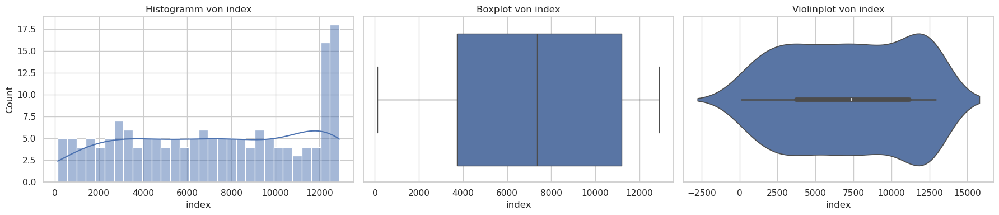

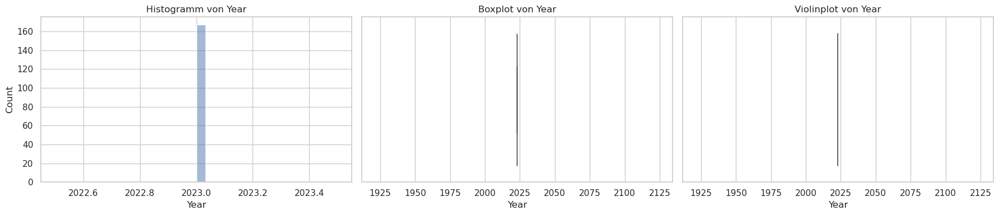

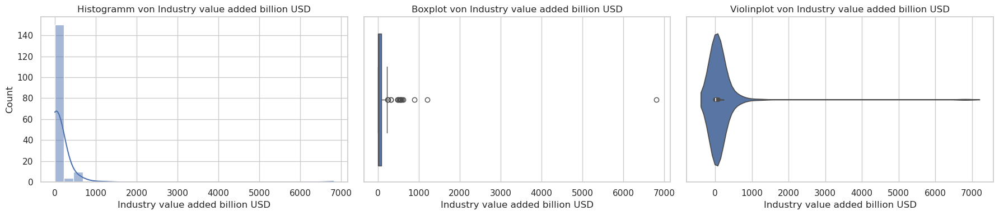

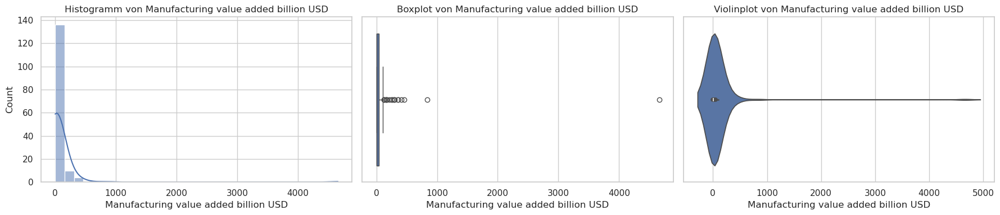

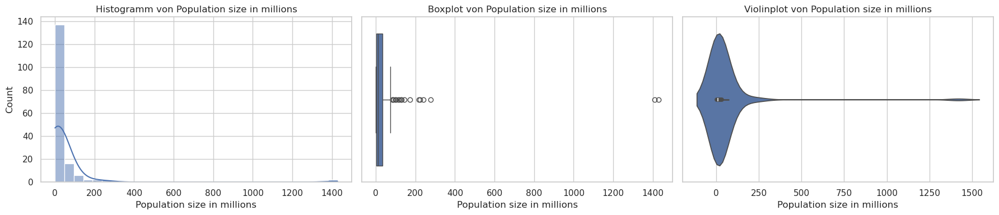

...

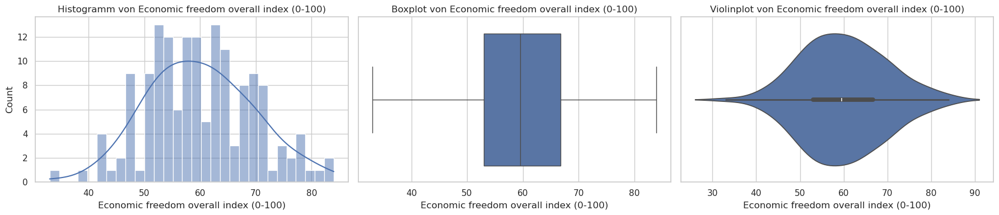

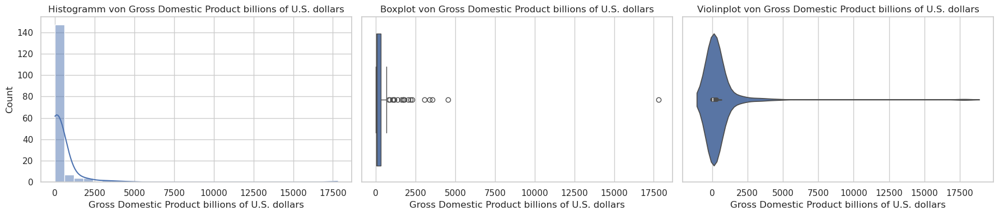

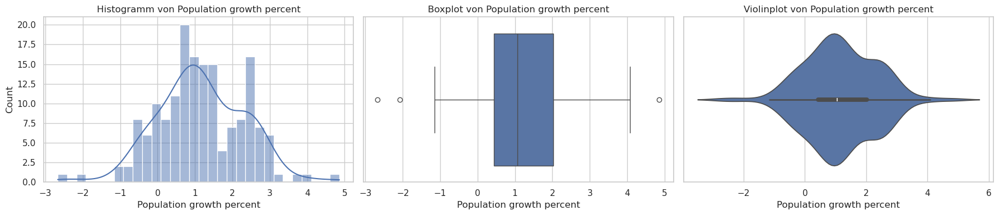

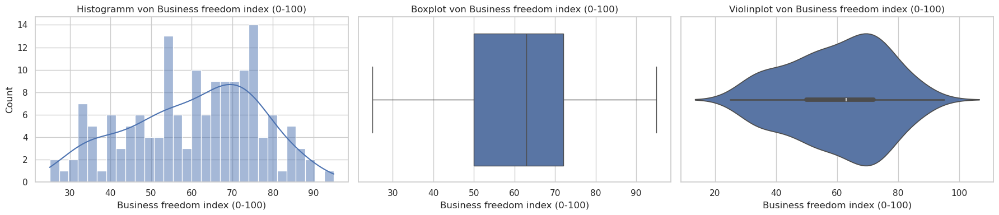

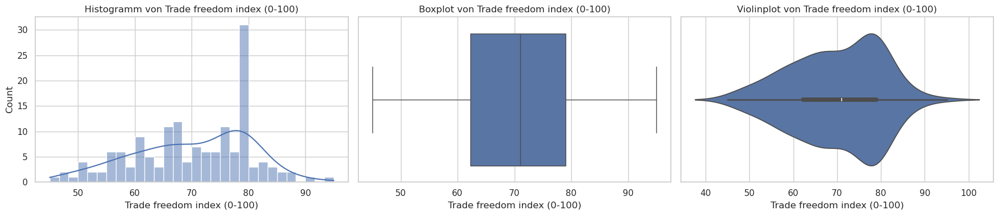

Überspringe Economic globalization index (0-100): keine gültigen Werte.


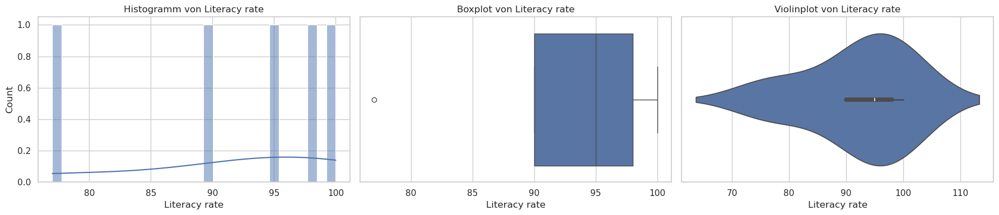

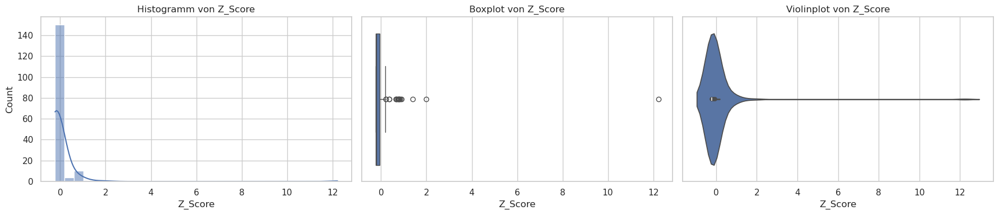

In [30]:
num_cols = df_2023.select_dtypes(include=['float64', 'int64']).columns

for col in num_cols:
    col_data = df_2023[col].dropna()

    # Wenn Spalte nur NaNs enthält, überspringen
    if col_data.empty:
        print(f"Überspringe {col}: keine gültigen Werte.")
        continue

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Histogramm
    sns.histplot(col_data, kde=True, bins=30, ax=axes[0])
    axes[0].set_title(f'Histogramm von {col}')

    # Boxplot
    sns.boxplot(x=col_data, ax=axes[1])
    axes[1].set_title(f'Boxplot von {col}')

    # Violinplot
    sns.violinplot(x=col_data, ax=axes[2])
    axes[2].set_title(f'Violinplot von {col}')

    plt.tight_layout()
    plt.show()


## Exploratory Data Analysis (EDA)

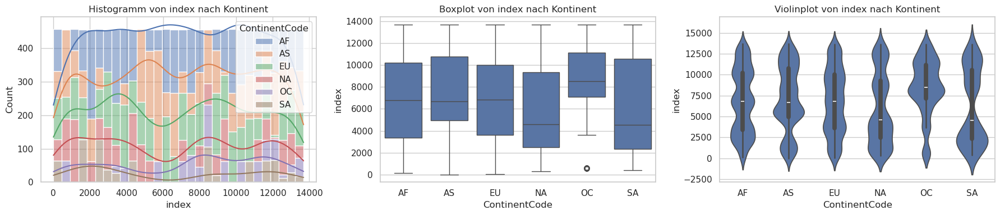

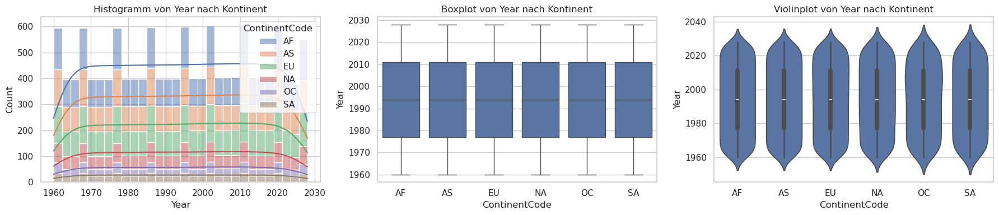

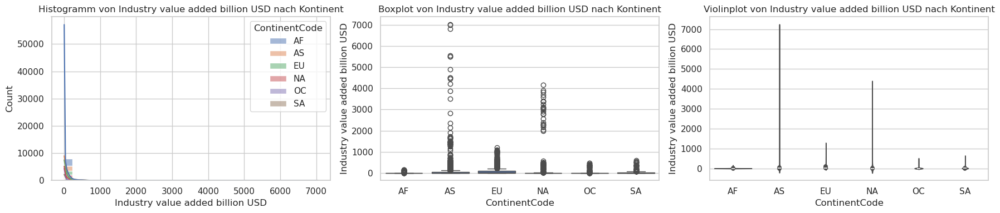

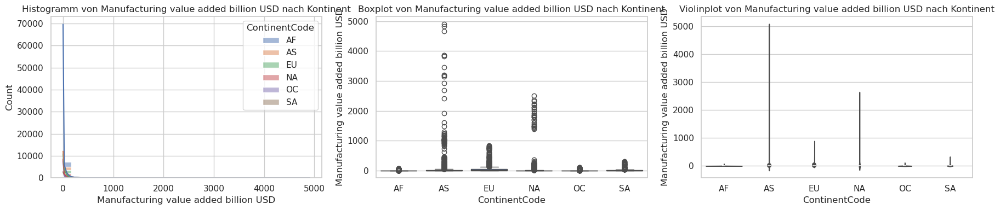

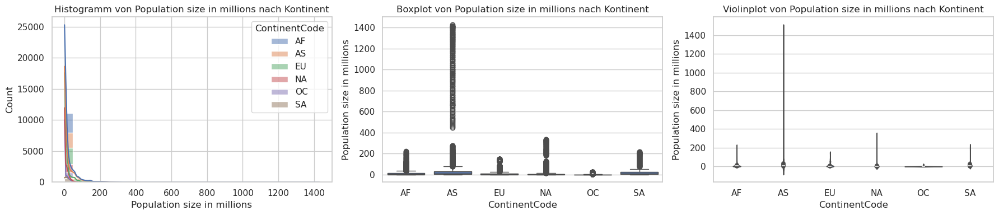

...

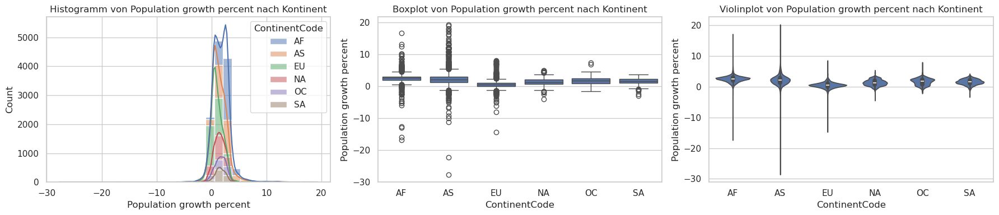

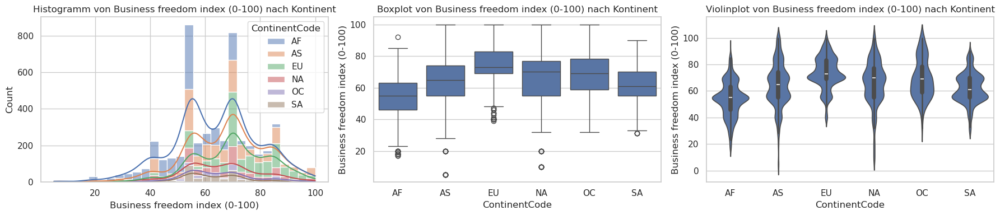

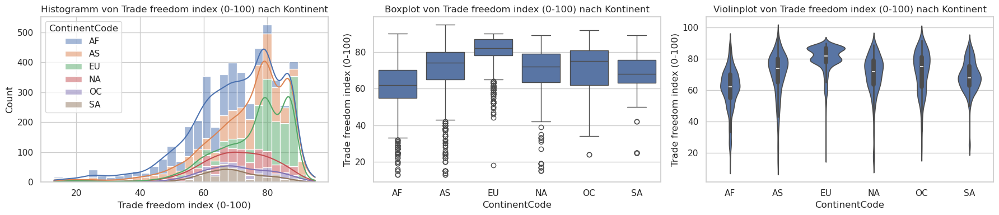

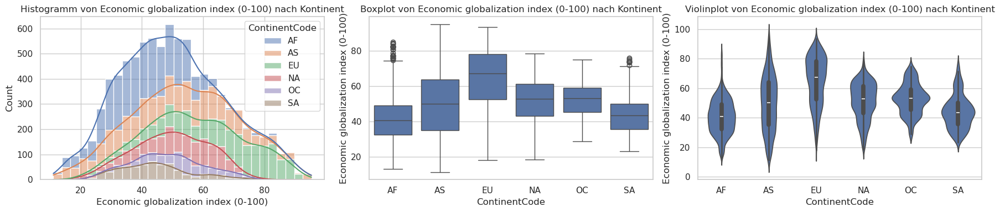

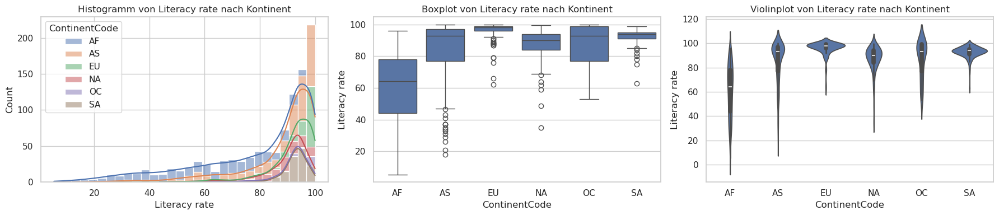

In [31]:
# Stelle sicher, dass die Kontinent-Spalte korrekt benannt ist
continent_col = 'ContinentCode'

# Nur numerische Spalten
num_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))  # drei Spalten, eine Zeile

    # Histogramm pro Kontinent
    sns.histplot(data=df, x=col, hue=continent_col, kde=True, bins=30, ax=axes[0], multiple="stack")
    axes[0].set_title(f'Histogramm von {col} nach Kontinent')

    # Boxplot pro Kontinent
    sns.boxplot(data=df, x=continent_col, y=col, ax=axes[1])
    axes[1].set_title(f'Boxplot von {col} nach Kontinent')

    # Violinplot pro Kontinent
    sns.violinplot(data=df, x=continent_col, y=col, ax=axes[2])
    axes[2].set_title(f'Violinplot von {col} nach Kontinent')

    plt.tight_layout()
    plt.show()


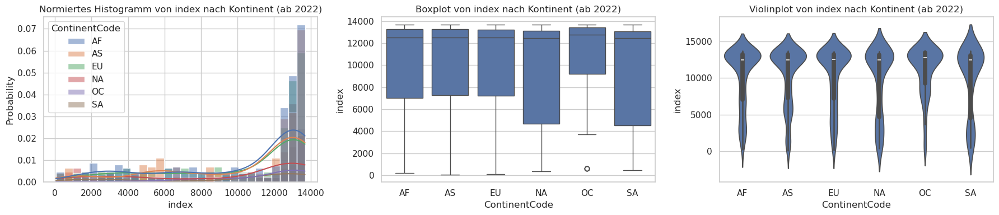

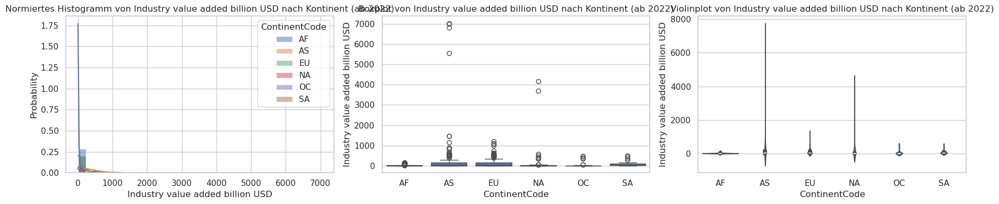

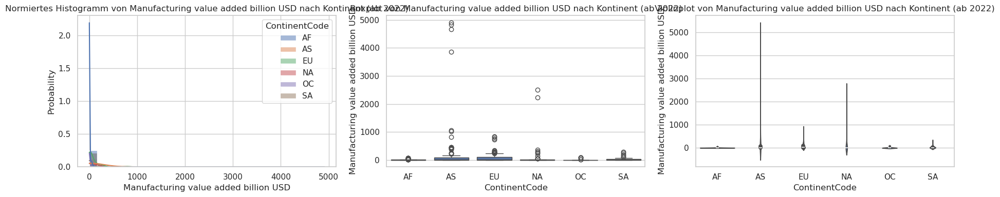

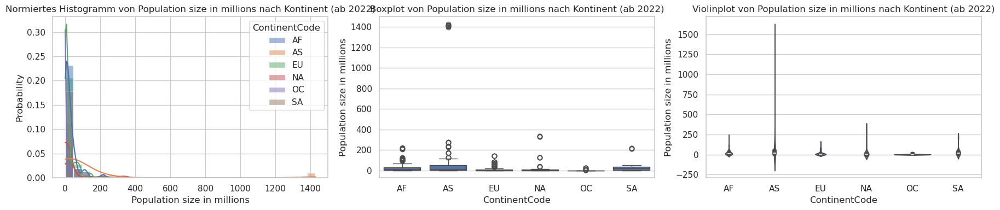

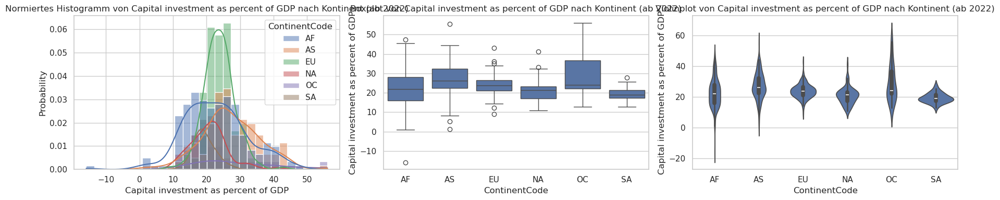

...

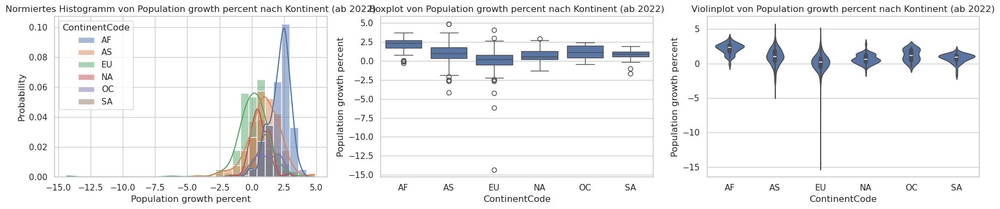

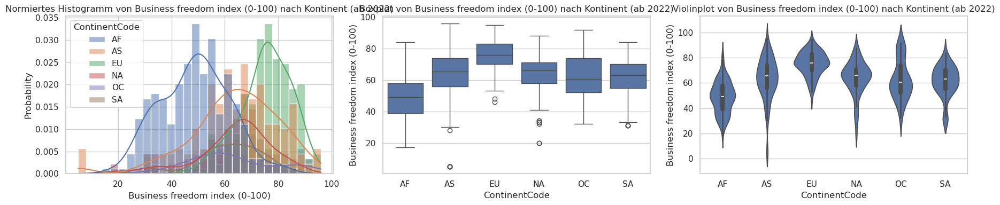

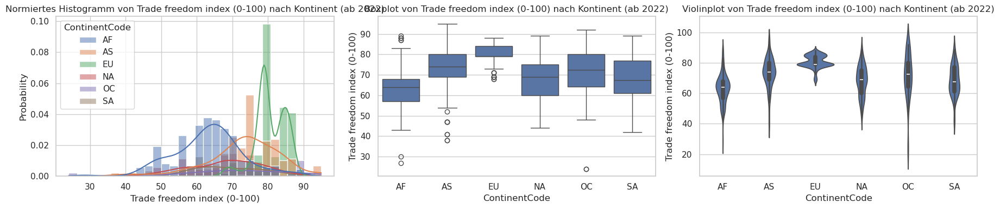

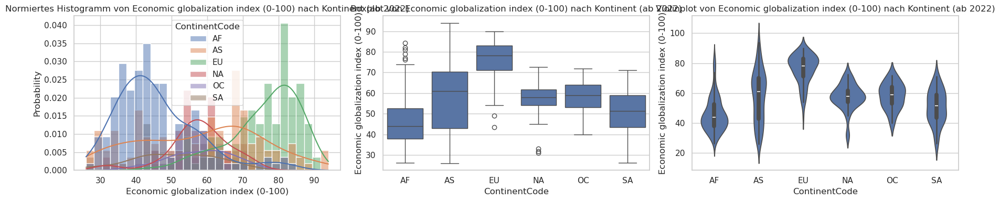

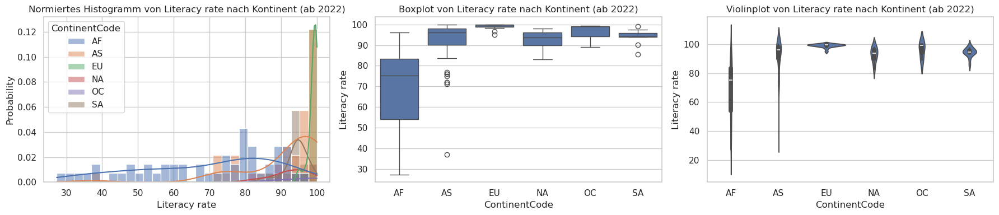

In [32]:
# Spaltennamen anpassen
continent_col = 'ContinentCode'
year_col = 'Year'

# Ab 2022 filtern
df_filtered = df[df[year_col] >= 2020].copy()

# Numerische Spalten ohne Jahr
num_cols = df_filtered.select_dtypes(include=['float64', 'int64']).columns
num_cols = [col for col in num_cols if col != year_col]

for col in num_cols:
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Histogramm mit normalisierter Häufigkeit
    sns.histplot(
        data=df_filtered,
        x=col,
        hue=continent_col,
        kde=True,
        bins=30,
        ax=axes[0],
        multiple="layer",  # Optional: "stack" oder "dodge"
        stat="probability"  # Oder "density"
    )
    axes[0].set_title(f'Normiertes Histogramm von {col} nach Kontinent (ab 2022)')

    # Boxplot
    sns.boxplot(data=df_filtered, x=continent_col, y=col, ax=axes[1])
    axes[1].set_title(f'Boxplot von {col} nach Kontinent (ab 2022)')

    # Violinplot
    sns.violinplot(data=df_filtered, x=continent_col, y=col, ax=axes[2])
    axes[2].set_title(f'Violinplot von {col} nach Kontinent (ab 2022)')

    plt.tight_layout()
    plt.show()


### Correlation Matrix

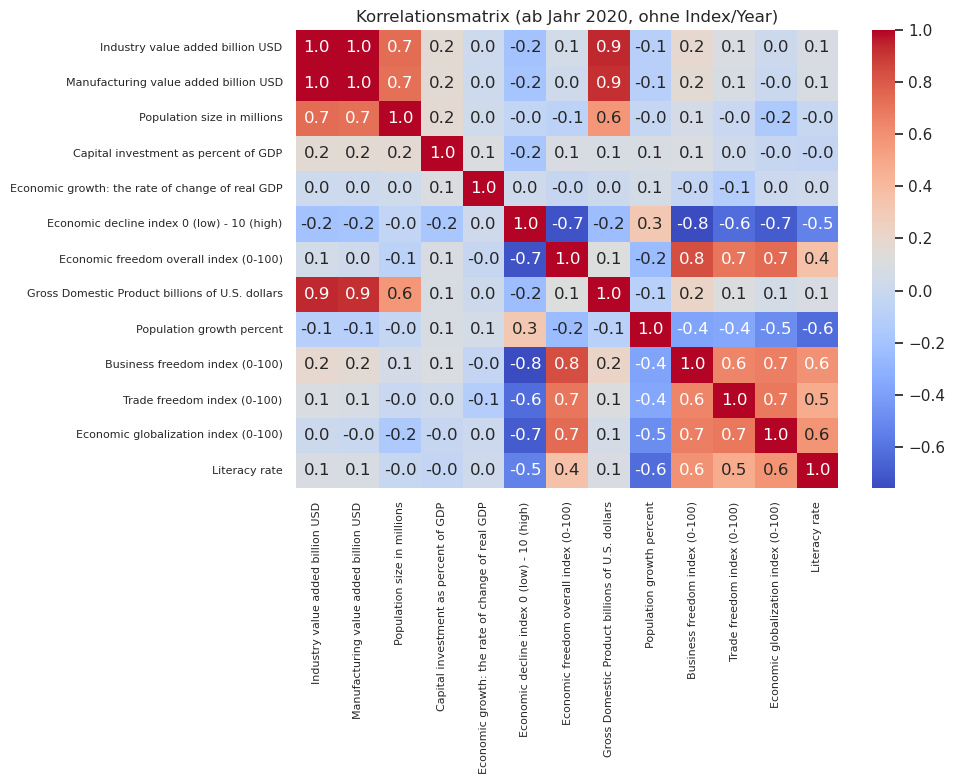

In [33]:
# Filter für Jahr >= 2020
df_filtered = df[df['Year'] >= 2020]

# Numerische Spalten auswählen, aber 'index' und 'Year' ausschließen
exclude_cols = ['index', 'Year']
num_cols = [col for col in df_filtered.select_dtypes(include=['float64', 'int64']).columns if col not in exclude_cols]

# Korrelationsmatrix plotten
plt.figure(figsize=(10, 8))
sns.heatmap(df_filtered[num_cols].corr(), annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Korrelationsmatrix (ab Jahr 2020, ohne Index/Year)')

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.tight_layout()
plt.savefig('korrelationsmatrix.png', dpi=600)
plt.show()


### Pairplot

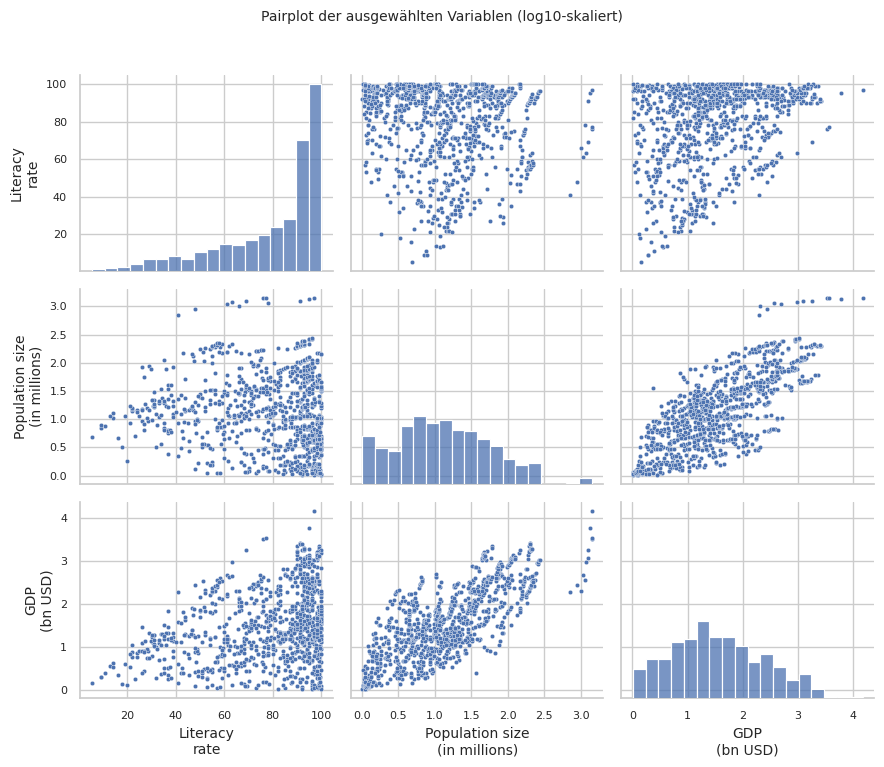

In [34]:
# Drei ausgewählte Variablen
selected_cols = [
    'Literacy rate',
    'Population size in millions',
    'Gross Domestic Product billions of U.S. dollars'
]

# Achsentitel in zwei Zeilen umformatieren
label_map = {
    'Literacy rate': 'Literacy\nrate',
    'Population size in millions': 'Population size\n(in millions)',
    'Gross Domestic Product billions of U.S. dollars': 'GDP\n(bn USD)'
}

# Log-Skalierung anwenden (außer 'Literacy rate')
df_log = df[selected_cols].dropna().copy()
df_log[selected_cols[1:]] = df_log[selected_cols[1:]].apply(lambda x: np.log10(x + 1))

# Pairplot mit kleineren Punkten
g = sns.pairplot(
    df_log,
    height=2.5,
    aspect=1.2,
    plot_kws={'s': 10}
)

# Achsenbeschriftungen anpassen (2-zeilig, größer)
for ax in g.axes.flatten():
    if ax is not None:
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()
        if xlabel in label_map:
            ax.set_xlabel(label_map[xlabel], fontsize=10)
        if ylabel in label_map:
            ax.set_ylabel(label_map[ylabel], fontsize=10)
        ax.tick_params(axis='both', labelsize=8)

# Titel und Layout
plt.suptitle('Pairplot der ausgewählten Variablen (log10-skaliert)', y=1.02, fontsize=10)
plt.tight_layout()
plt.show()


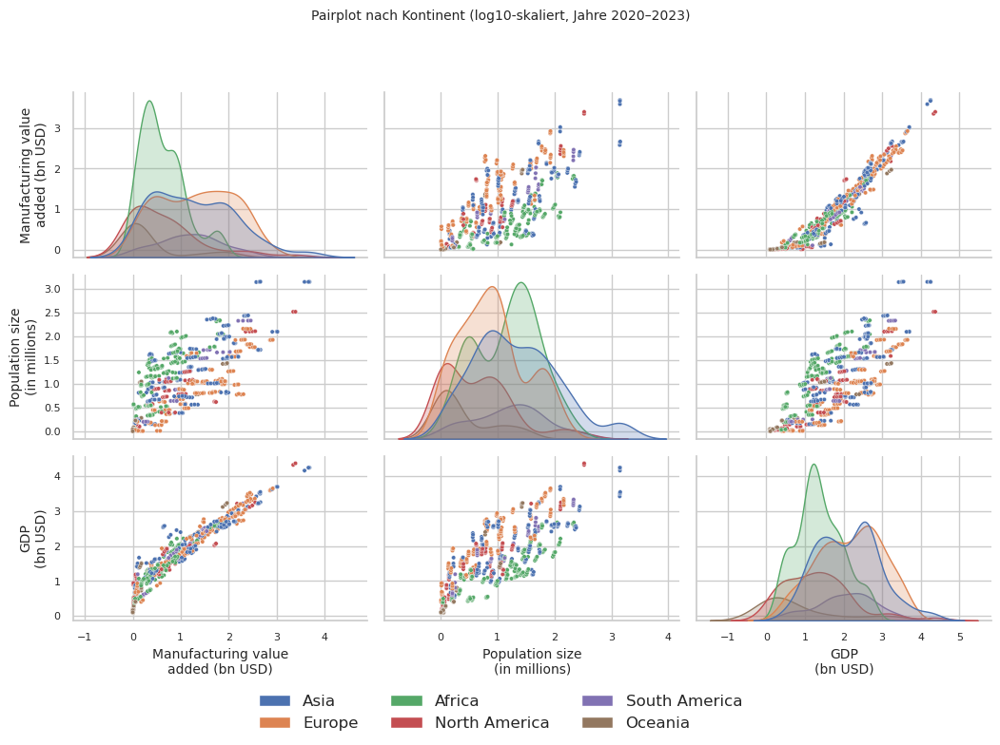

In [35]:
# Drei ausgewählte Variablen
selected_cols = [
    'Manufacturing value added billion USD',
    'Population size in millions',
    'Gross Domestic Product billions of U.S. dollars'
]

# Achsentitel in zwei Zeilen umformatieren
label_map = {
    'Manufacturing value added billion USD': 'Manufacturing value\nadded (bn USD)',
    'Population size in millions': 'Population size\n(in millions)',
    'Gross Domestic Product billions of U.S. dollars': 'GDP\n(bn USD)'
}

# Daten filtern: nur 2020–2023, keine NaN, 'Continent' einbeziehen
df_filtered = df[df['Year'].between(2020, 2023)].copy()
df_log = df_filtered[selected_cols + ['Continent']].dropna().copy()

# Log-Skalierung anwenden
df_log[selected_cols] = df_log[selected_cols].apply(lambda x: np.log10(x + 1))

# Pairplot mit hue=Continent
g = sns.pairplot(
    df_log,
    hue='Continent',
    height=2.5,
    aspect=1.2,
    plot_kws={'s': 10}
)

# Automatische Legende entfernen
if g._legend is not None:
    g._legend.remove()

# Farben aus Line2D-Objekten extrahieren
legend_elements = [
    Patch(facecolor=g._legend_data[label].get_color(), label=label)
    for label in g._legend_data
]

# Achsenbeschriftungen anpassen (2-zeilig, größer)
for ax in g.axes.flatten():
    if ax is not None:
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()
        if xlabel in label_map:
            ax.set_xlabel(label_map[xlabel], fontsize=10)
        if ylabel in label_map:
            ax.set_ylabel(label_map[ylabel], fontsize=10)
        ax.tick_params(axis='both', labelsize=8)

# Neue, sichtbare Legende unten zentriert einfügen
g.fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

# Titel und Layout
plt.suptitle('Pairplot nach Kontinent (log10-skaliert, Jahre 2020–2023)', y=1.03, fontsize=10)
plt.tight_layout(rect=[0, 0.07, 1, 0.98])  # Platz für Legende schaffen
plt.show()


### Paretoplot

/tmp/ipykernel_2743574/2958058207.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_pop = df_pop.groupby('Country', as_index=False)['Population size in millions'].sum()


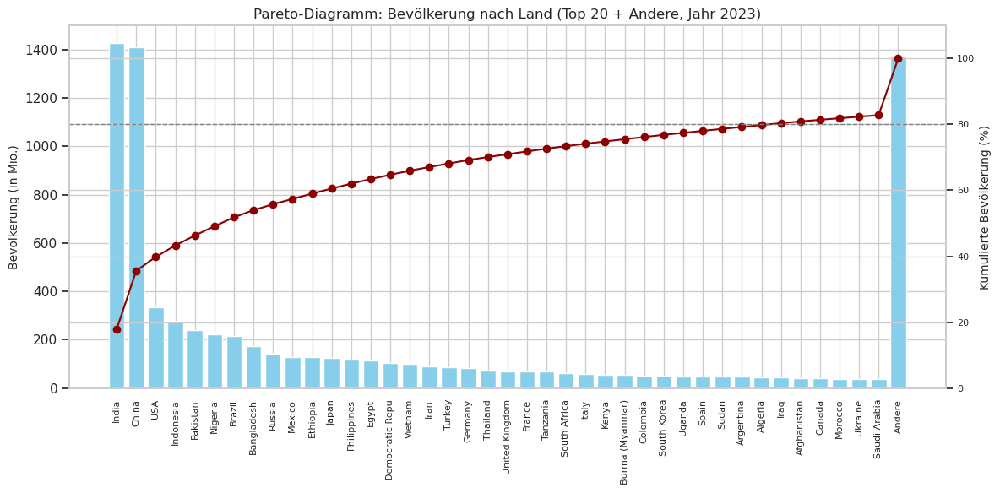

In [36]:
# --- 1. Daten vorbereiten ---

# Filter auf Jahr 2023 und relevante Spalten
df_2023 = df[df['Year'] == 2023].copy()
df_pop = df_2023[['Country', 'Population size in millions']].dropna()

# Gruppieren nach Land (falls mehrfach vorhanden) und summieren
df_pop = df_pop.groupby('Country', as_index=False)['Population size in millions'].sum()

# Sortieren nach Bevölkerungsgröße
df_pop_sorted = df_pop.sort_values(by='Population size in millions', ascending=False).reset_index(drop=True)

# --- 2. Top 20 + "Andere" zusammenfassen ---
top_n = 40
df_top = df_pop_sorted.head(top_n).copy()

# Restliche Länder aggregieren
rest = df_pop_sorted.tail(len(df_pop_sorted) - top_n)
other_sum = rest['Population size in millions'].sum()

# "Andere"-Zeile hinzufügen
df_top = pd.concat([
    df_top,
    pd.DataFrame([{'Country': 'Andere', 'Population size in millions': other_sum}])
], ignore_index=True)

# Kumulierte Prozentwerte berechnen
df_top['cum_percent'] = df_top['Population size in millions'].cumsum() / df_top['Population size in millions'].sum() * 100

# Optional: Ländernamen kürzen, falls zu lang
df_top['Country'] = df_top['Country'].str.slice(0, 15)

# --- 3. Plot erstellen ---

fig, ax1 = plt.subplots(figsize=(12, 6))

# Balken für absolute Bevölkerungsgröße
ax1.bar(df_top['Country'], df_top['Population size in millions'], color='skyblue')
ax1.set_ylabel('Bevölkerung (in Mio.)', fontsize=10)
ax1.tick_params(axis='x', rotation=90, labelsize=8)

# Zweite Y-Achse für kumulierte Prozentwerte
ax2 = ax1.twinx()
ax2.plot(df_top['Country'], df_top['cum_percent'], color='darkred', marker='o')
ax2.set_ylabel('Kumulierte Bevölkerung (%)', fontsize=10)
ax2.tick_params(axis='y', labelsize=8)
ax2.set_ylim(0, 110)

# Hilfslinie bei 80 %
ax2.axhline(80, color='gray', linestyle='dashed', linewidth=1)

# Titel und Layout
plt.title('Pareto-Diagramm: Bevölkerung nach Land (Top 20 + Andere, Jahr 2023)', fontsize=12)
plt.tight_layout()
plt.show()


## Data preparation & transformation

In [37]:
df

,ContinentCode,Continent,index,Country,Code,Year,Industry value added billion USD,Manufacturing value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Gross Domestic Product billions of U.S. dollars,Population growth percent,Business freedom index (0-100),Trade freedom index (0-100),Economic globalization index (0-100),Literacy rate
0,AS,Asia,0,Afghanistan,AFG,1960,NaN,NaN,8.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AS,Asia,1,Afghanistan,AFG,1961,NaN,NaN,8.79,NaN,NaN,NaN,NaN,NaN,1.93,NaN,NaN,NaN,NaN
2,AS,Asia,2,Afghanistan,AFG,1962,NaN,NaN,8.97,NaN,NaN,NaN,NaN,NaN,2.01,NaN,NaN,NaN,NaN
3,AS,Asia,3,Afghanistan,AFG,1963,NaN,NaN,9.16,NaN,NaN,NaN,NaN,NaN,2.08,NaN,NaN,NaN,NaN
4,AS,Asia,4,Afghanistan,AFG,1964,NaN,NaN,9.36,NaN,NaN,NaN,NaN,NaN,2.14,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13687,AF,Africa,13687,Zambia,ZMB,2028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13688,AF,Africa,13688,Zimbabwe,ZWE,2025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13689,AF,Africa,13689,Zimbabwe,ZWE,2026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13690,AF,Africa,13690,Zimbabwe,ZWE,2027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13692 entries, 0 to 13691
Data columns (total 19 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   ContinentCode                                    13692 non-null  category
 1   Continent                                        13692 non-null  object  
 2   index                                            13692 non-null  int64   
 3   Country                                          13692 non-null  category
 4   Code                                             13692 non-null  category
 5   Year                                             13692 non-null  int64   
 6   Industry value added billion USD                 8324 non-null   float64 
 7   Manufacturing value added billion USD            7498 non-null   float64 
 8   Population size in millions                      12514 non-null  float64 
 9   Capital investmen

#### Select final dataset

In [39]:
# Jahr 2023 filtern
df_2023 = df[df['Year'] == 2023]

# Die Spalten auswählen, die wir brauchen (ab Spalte 6, aber ohne bestimmte Spalten)
columns_to_keep = ['ContinentCode', 'Continent', 'Country', 'Code'] + \
                  [col for col in df.columns[6:-2] if col not in ['Economic globalization index (0-100)', 'Literacy rate','Manufacturing value added billion USD']]

# Neue DataFrame mit den gefilterten Daten
df_2023_filtered = df_2023[columns_to_keep]
# Nur numerische Spalten auswählen
numeric_columns = df_2023_filtered.select_dtypes(include=['float64']).columns

# NaN-Werte nur in den numerischen Spalten auf 0 setzen
df_2023_filtered[numeric_columns] = df_2023_filtered[numeric_columns].fillna(0)

# Continent-Spalte als kategorisch umwandeln
df_2023_filtered['Continent'] = df_2023_filtered['Continent'].astype('category')
df_2023_filtered.head()

/tmp/ipykernel_2743574/334658295.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_filtered[numeric_columns] = df_2023_filtered[numeric_columns].fillna(0)
/tmp/ipykernel_2743574/334658295.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_filtered['Continent'] = df_2023_filtered['Continent'].astype('category')


,ContinentCode,Continent,Country,Code,Industry value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Gross Domestic Product billions of U.S. dollars,Population growth percent,Business freedom index (0-100),Trade freedom index (0-100)
125,EU,Europe,Albania,ALB,5.42,2.75,0.00,3.94,6.1,65.0,23.55,-1.15,71.0,83.0
188,AF,Africa,Algeria,DZA,93.50,45.61,37.74,4.10,6.2,43.0,247.63,1.55,54.0,58.0
313,AF,Africa,Angola,AGO,38.39,36.68,26.61,1.00,8.2,53.0,84.82,3.03,42.0,65.0
376,NA,North America,Antigua and Barbuda,ATG,0.40,0.09,0.00,3.86,6.6,0.0,2.03,0.57,0.0,0.0
440,SA,South America,Argentina,ARG,161.88,46.65,19.47,-1.61,6.6,51.0,646.08,0.90,56.0,61.0


#### Feature distribution

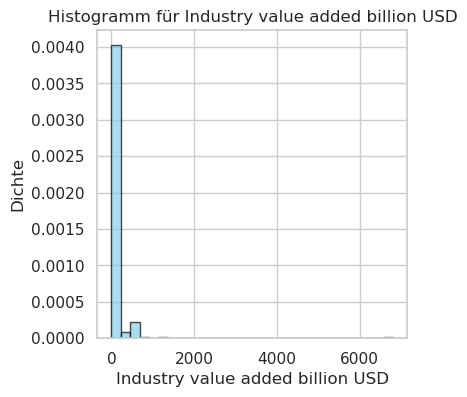

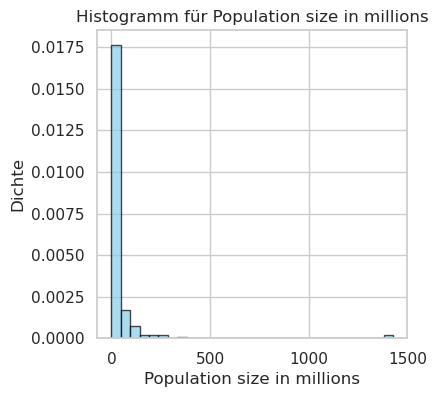

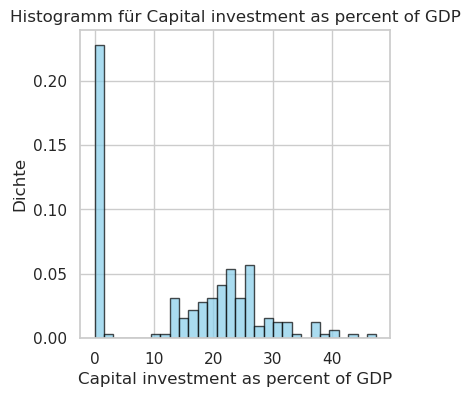

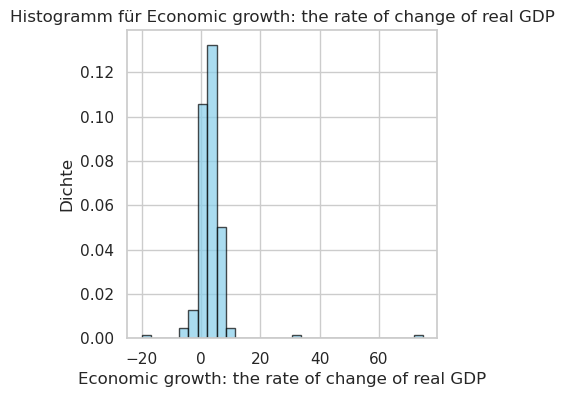

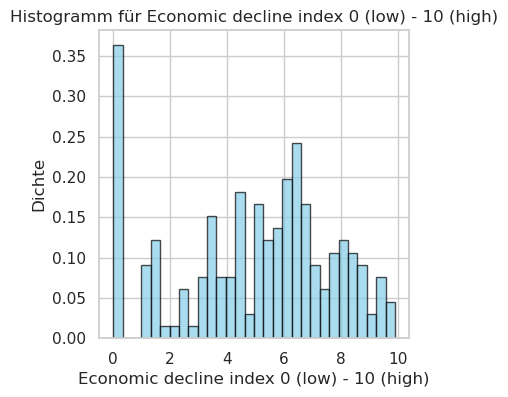

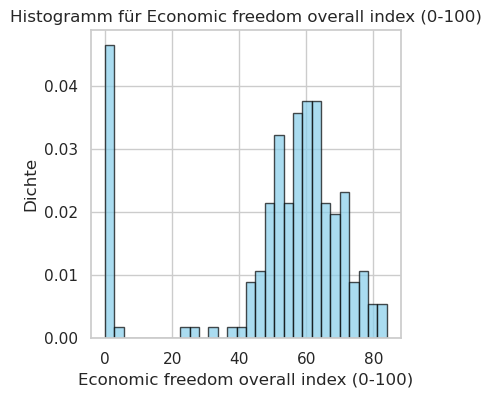

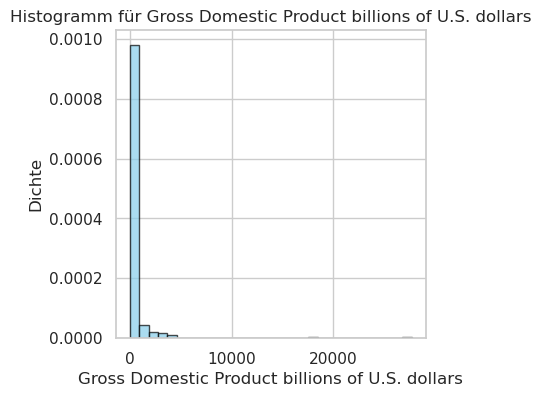

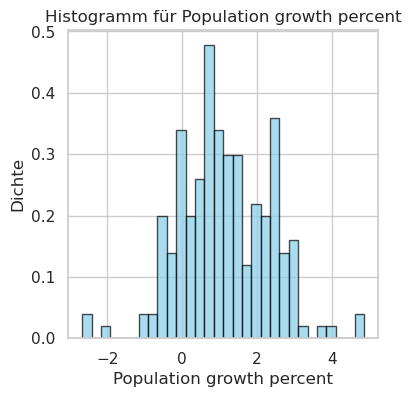

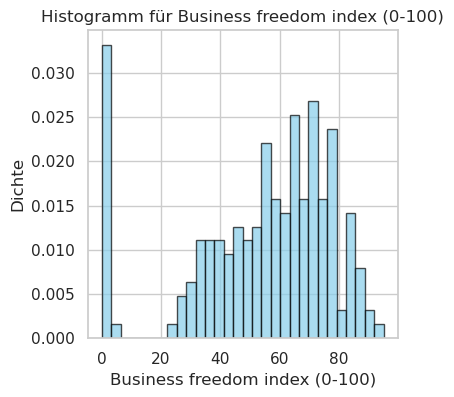

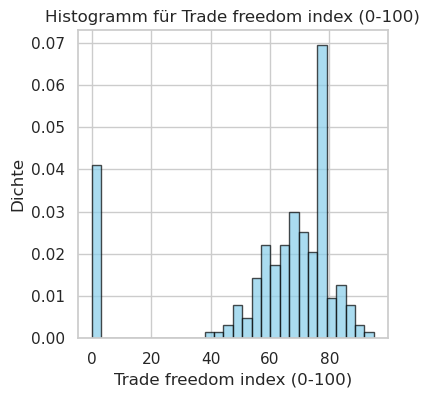

In [40]:
# Erstelle für jede numerische Spalte ein Histogramm
for column in numeric_columns:
    plt.figure(figsize=(4,4))
    df_2023_filtered[column].plot(kind='hist', bins=30, edgecolor='black', alpha=0.7, color='skyblue', density=True)
    
    # Titel und Labels
    plt.title(f"Histogramm für {column}")
    plt.xlabel(column)
    plt.ylabel('Dichte')

    # Zeige den Plot an
    plt.show()

#### Log 10 scaling

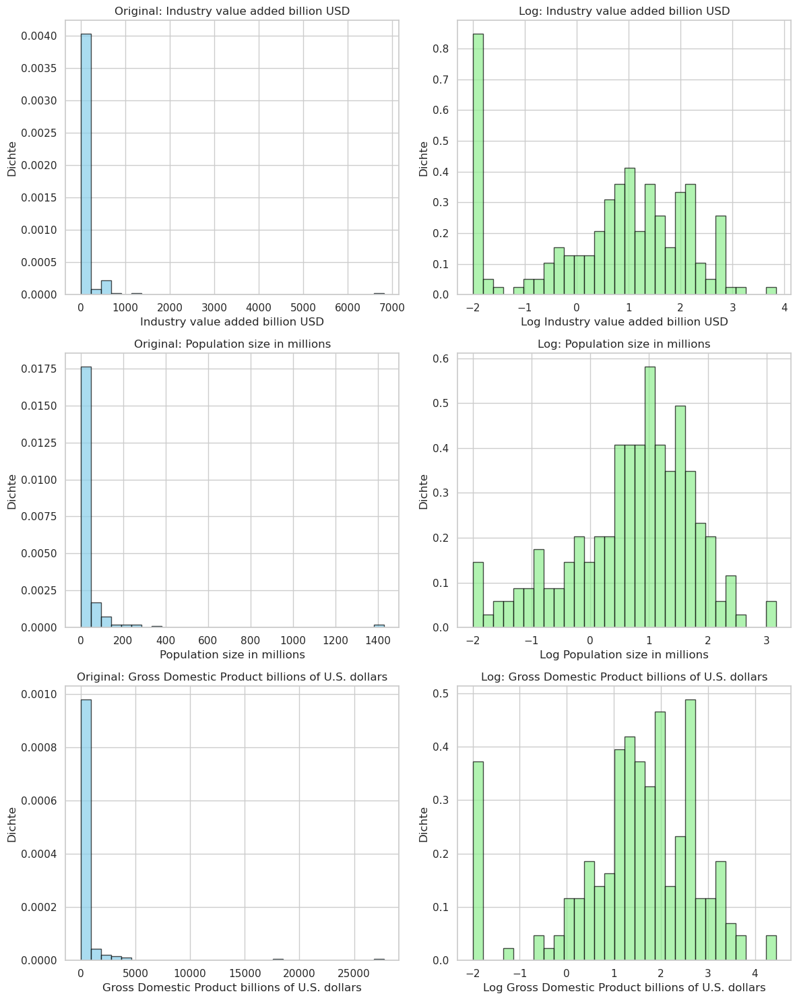

In [41]:
# Die Spalten für die Log-Skalierung auswählen
columns_to_scale = [
    'Industry value added billion USD',
    'Population size in millions',
    'Gross Domestic Product billions of U.S. dollars'
]

# Log-Skalierung zur Basis 10 anwenden, Nullwerte durch einen kleinen Wert ersetzen
df_log = pd.DataFrame()
for column in columns_to_scale:
    df_log[column] = np.log10(df_2023_filtered[column].replace(0, 1e-2))

# Erstelle Subplots nebeneinander
fig, axes = plt.subplots(len(columns_to_scale), 2, figsize=(12, 5 * len(columns_to_scale)))

# Originalwerte und log-transformierte Werte nebeneinander plotten
for i, column in enumerate(columns_to_scale):
    # Originaldaten
    axes[i, 0].hist(df_2023_filtered[column].dropna(), bins=30, edgecolor='black', alpha=0.7, color='skyblue', density=True)
    axes[i, 0].set_title(f"Original: {column}")
    axes[i, 0].set_xlabel(column)
    axes[i, 0].set_ylabel('Dichte')

    # Log-transformierte Daten
    axes[i, 1].hist(df_log[column].dropna(), bins=30, edgecolor='black', alpha=0.7, color='lightgreen', density=True)
    axes[i, 1].set_title(f"Log: {column}")
    axes[i, 1].set_xlabel(f"Log {column}")
    axes[i, 1].set_ylabel('Dichte')

# Layout anpassen
plt.tight_layout()

# Zeige die Plots an
plt.show()

In [42]:
# Mittelwert und Standardabweichung für jede log-transformierte Spalte berechnen
log_stats = df_log.agg(['mean', 'std'])

# Ergebnisse ausgeben
print("Mittelwert und Standardabweichung der log-transformierten Spalten:")

log_stats

Mittelwert und Standardabweichung der log-transformierten Spalten:


,Industry value added billion USD,Population size in millions,Gross Domestic Product billions of U.S. dollars
mean,0.610407,0.729905,1.426675
std,1.498267,1.038063,1.386822


In [81]:
len(df_log[df_log['Industry value added billion USD']==-2])

33

#### 1. Z-Transformation

In [86]:
def z_transform_ignore_neg2(col):
    mask = col != -2
    # Mittelwert und Std ohne -2 berechnen
    mean = col[mask].mean()
    std = col[mask].std()
    # Z-Transformation nur für gültige Werte, -2 bleibt erhalten
    z = col.copy()
    z[mask] = (col[mask] - mean) / std
    return z

# Anwenden auf alle Spalten
df_z_log = df_log.apply(z_transform_ignore_neg2, axis=0)

# Dann wie zuvor:
mean_filtered = df_z_log.where(df_z_log != -2).mean(axis=0)
std_filtered  = df_z_log.where(df_z_log != -2).std(axis=0)
z_log_stats = pd.DataFrame([mean_filtered, std_filtered], index=['mean', 'std'])

print("Mittelwert und Standardabweichung der z-transformierten log-Spalten (jeweils ohne -2):")
z_log_stats


Mittelwert und Standardabweichung der z-transformierten log-Spalten (jeweils ohne -2):


,Industry value added billion USD,Population size in millions,Gross Domestic Product billions of U.S. dollars
mean,-9.573181e-17,-1.115916e-16,-1.255035e-16
std,1.000000e+00,1.000000e+00,1.000000e+00


In [87]:
df_z_log

,Industry value added billion USD,Population size in millions,Gross Domestic Product billions of U.S. dollars
125,-0.379413,-0.378323,-0.357053
188,0.816962,0.901459,0.677498
313,0.443008,0.802169,0.206392
376,-1.474343,-1.936533,-1.434818
440,1.047549,0.911733,1.099173
...,...,...,...
12804,-2.000000,-2.000000,-2.983228
12817,-2.000000,-2.437146,-2.000000
12858,-2.000000,-2.000000,-2.000000
12891,-2.000000,-2.306056,-2.000000


#### 2. Z-Transformation 

In [88]:
# Wähle alle numerischen Spalten aus, die nicht in columns_to_exclude sind
numerical_columns = df_2023_filtered.select_dtypes(include=['float64', 'int64']).columns
columns_to_transform = [col for col in numerical_columns if col not in columns_to_scale]

# Z-Transformation der ausgewählten numerischen Spalten
df_z_numerical = df_2023_filtered[columns_to_transform].apply(lambda x: (x - x.mean()) / x.std(), axis=0)

# Kombinierte Z-transformierte DataFrames (log-transformiert und andere numerische Spalten)
df_z_combined = pd.concat([df_z_log, df_z_numerical], axis=1)

In [89]:
stats = df_z_combined.agg(['mean', 'std'])
stats

,Industry value added billion USD,Population size in millions,Gross Domestic Product billions of U.S. dollars,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Population growth percent,Business freedom index (0-100),Trade freedom index (0-100)
mean,-0.330000,-0.050000,-0.160000,-7.105427e-17,-4.440892e-17,7.993606e-17,1.065814e-16,4.440892e-18,7.105427e-17,-8.881784e-17
std,1.178151,1.035792,1.102487,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [90]:
# Schritt 1: Identifiziere die nicht-numerischen Spalten im ursprünglichen DataFrame
non_numeric_columns = [col for col in df_2023_filtered.columns if not pd.api.types.is_numeric_dtype(df_2023_filtered[col])]

# Schritt 2: Hänge die nicht-numerischen Spalten an das Ende von df_scaled_copy
df_scaled = pd.concat([df_2023_filtered[non_numeric_columns], df_z_combined], axis=1)


df_scaled

,ContinentCode,Continent,Country,Code,Industry value added billion USD,Population size in millions,Gross Domestic Product billions of U.S. dollars,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Population growth percent,Business freedom index (0-100),Trade freedom index (0-100)
125,EU,Europe,Albania,ALB,-0.379413,-0.378323,-0.357053,-1.185321,0.121846,0.404473,0.585451,-1.900321,0.707592,0.859652
188,AF,Africa,Algeria,DZA,0.816962,0.901459,0.677498,1.834309,0.146813,0.440571,-0.387353,0.350010,0.009850,-0.116116
313,AF,Africa,Angola,AGO,0.443008,0.802169,0.206392,0.943782,-0.336921,1.162522,0.054831,1.583524,-0.482673,0.157099
376,NA,North America,Antigua and Barbuda,ATG,-1.474343,-1.936533,-1.434818,-1.185321,0.109363,0.584961,-2.288743,-0.466777,-2.206504,-2.379900
440,SA,South America,Argentina,ARG,1.047549,0.911733,1.099173,0.372501,-0.744194,0.584961,-0.033606,-0.191736,0.091938,0.000976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12804,OC,Oceania,Tuvalu,TUV,-2.000000,-2.000000,-2.983228,-1.185321,0.107803,-1.797478,-2.288743,-0.325089,-2.206504,-2.379900
12817,EU,Europe,Gibraltar,GIB,-2.000000,-2.437146,-2.000000,-1.185321,-0.492964,-1.797478,-2.288743,-0.841832,-2.206504,-2.379900
12858,NA,North America,Montserrat,MSR,-2.000000,-2.000000,-2.000000,-1.185321,-0.492964,-1.797478,-2.288743,-0.941847,-2.206504,-2.379900
12891,EU,Europe,Liechtenstein,LIE,-2.000000,-2.306056,-2.000000,-1.185321,-0.492964,-1.797478,-2.288743,-0.400100,-2.206504,1.015775


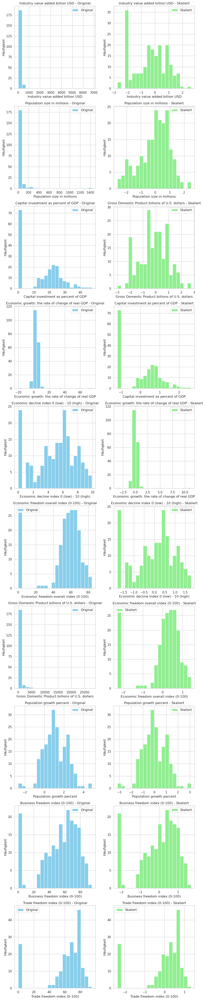

In [91]:
# Selektiere nur die numerischen Spalten
numerical_columns_filtered = df_2023_filtered.select_dtypes(include=['number']).columns
numerical_columns_scaled = df_scaled.select_dtypes(include=['number']).columns

# Anzahl der numerischen Spalten
n = len(numerical_columns_filtered)

# Erstelle eine Figur mit Subplots
fig, axes = plt.subplots(n, 2, figsize=(10, 5 * n))

# Durchlaufe die numerischen Spaltenpaare
for i in range(n):
    # Original Spalte aus df_2023_filtered
    axes[i, 0].hist(df_2023_filtered[numerical_columns_filtered[i]], bins=20, alpha=1, color='skyblue', label='Original')
    axes[i, 0].set_title(f'{numerical_columns_filtered[i]} - Original')
    axes[i, 0].set_xlabel(numerical_columns_filtered[i])
    axes[i, 0].set_ylabel('Häufigkeit')
    axes[i, 0].legend()

    # Skalierte Spalte aus df_scaled
    axes[i, 1].hist(df_scaled[numerical_columns_scaled[i]], bins=20, alpha=1, color='lightgreen', label='Skaliert')
    axes[i, 1].set_title(f'{numerical_columns_scaled[i]} - Skaliert')
    axes[i, 1].set_xlabel(numerical_columns_scaled[i])
    axes[i, 1].set_ylabel('Häufigkeit')
    axes[i, 1].legend()

# Layout anpassen
plt.tight_layout()
plt.show()


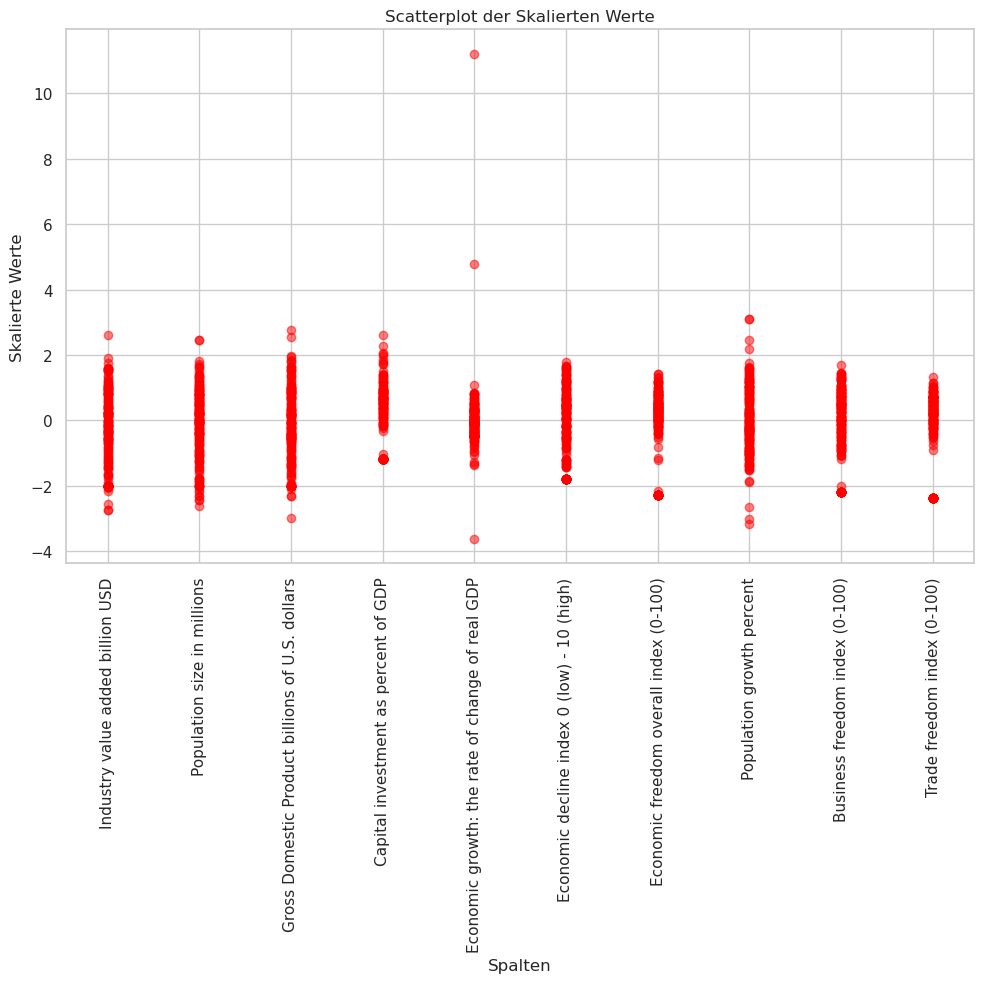

In [92]:
# Selektiere nur die numerischen Spalten
numerical_columns_scaled = df_scaled.select_dtypes(include=['number']).columns

# Erstelle eine Figur
fig, ax = plt.subplots(figsize=(10, 10))

# Plot für jede numerische Spalte (nur die skalierten Werte)
for i in range(len(numerical_columns_scaled)):
    ax.scatter(
        [i] * len(df_scaled),  # X-Werte (jeweils der Index der Spalte)
        df_scaled[numerical_columns_scaled[i]],  # Y-Werte aus df_scaled
        alpha=0.5, label=f'{numerical_columns_scaled[i]} - Skaliert', color='red'
    )

# X-Achsen anpassen
ax.set_xticks(range(len(numerical_columns_scaled)))
ax.set_xticklabels(numerical_columns_scaled, rotation=90)

# Achsenbeschriftungen
ax.set_xlabel('Spalten')
ax.set_ylabel('Skalierte Werte')

# Titel und Legende
ax.set_title('Scatterplot der Skalierten Werte')
# Layout anpassen
plt.tight_layout()
plt.show()


## Dimensionality Reduction 

#### Feature Subset Selection / Correlation Matrix

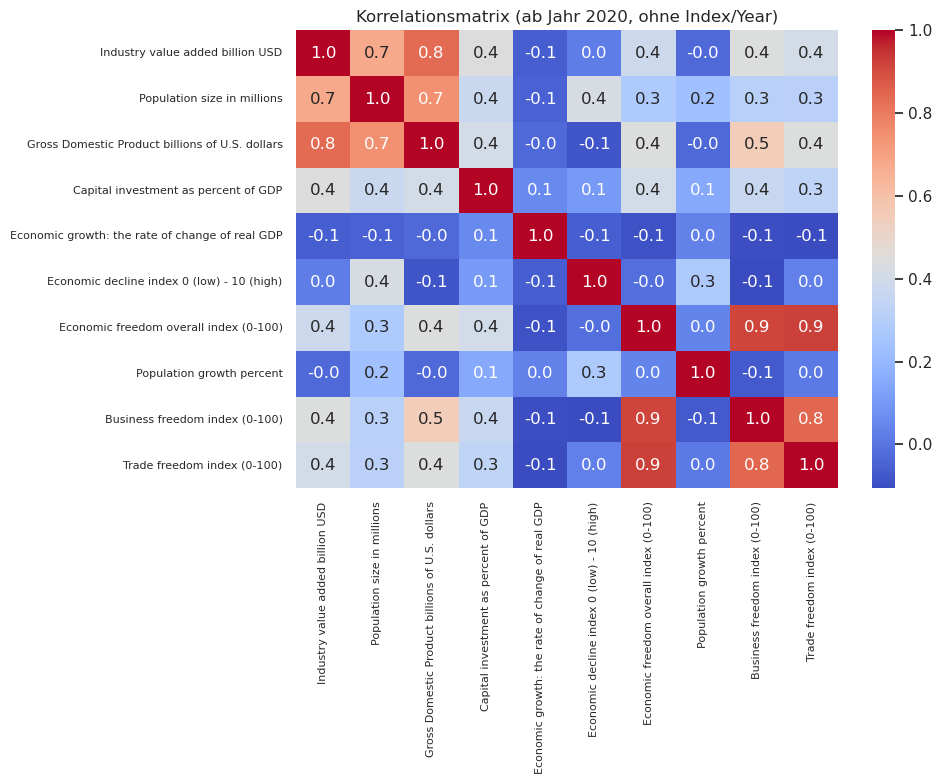

In [93]:
num_cols = [col for col in df_scaled.select_dtypes(include=['float64', 'int64']).columns]

# Korrelationsmatrix plotten
plt.figure(figsize=(10, 8))
sns.heatmap(df_scaled[num_cols].corr(), annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Korrelationsmatrix (ab Jahr 2020, ohne Index/Year)')

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.tight_layout()
plt.savefig('korrelationsmatrix.png', dpi=600)
plt.show()


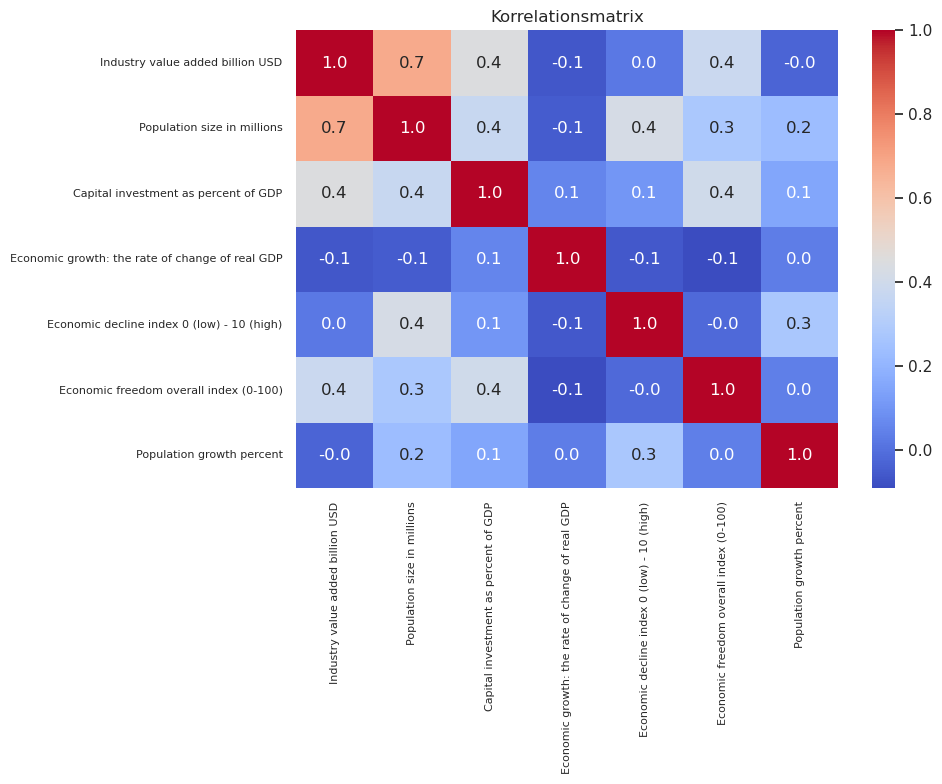

In [94]:
df_scaled = df_scaled.drop(columns=['Business freedom index (0-100)', 'Trade freedom index (0-100)','Gross Domestic Product billions of U.S. dollars'])

num_cols = [col for col in df_scaled.select_dtypes(include=['float64', 'int64']).columns]

# Korrelationsmatrix plotten
plt.figure(figsize=(10, 8))
sns.heatmap(df_scaled[num_cols].corr(), annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Korrelationsmatrix')

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.tight_layout()
plt.savefig('korrelationsmatrix.png', dpi=600)
plt.show()


### PCA

In [95]:
df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 125 to 12905
Data columns (total 11 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   ContinentCode                                    200 non-null    category
 1   Continent                                        200 non-null    category
 2   Country                                          200 non-null    category
 3   Code                                             200 non-null    category
 4   Industry value added billion USD                 200 non-null    float64 
 5   Population size in millions                      200 non-null    float64 
 6   Capital investment as percent of GDP             200 non-null    float64 
 7   Economic growth: the rate of change of real GDP  200 non-null    float64 
 8   Economic decline index 0 (low) - 10 (high)       200 non-null    float64 
 9   Economic freedom overa

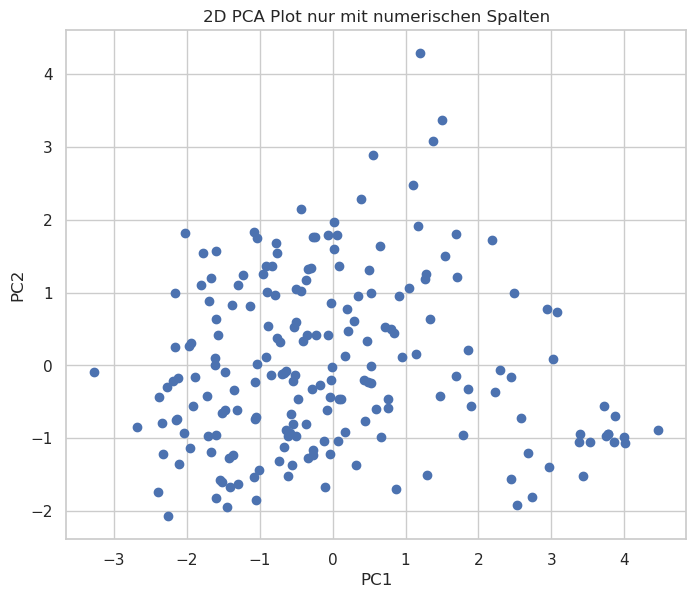

In [96]:
# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

# 2D PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Country'] = df['Country']
df_pca['Continent'] = df['Continent']

# Scatter-Plot mit Matplotlib
plt.figure(figsize=(8, 8))  # Die Größe des Plots festlegen (quadratisch)
plt.scatter(df_pca['PC1'], df_pca['PC2'])
plt.title('2D PCA Plot nur mit numerischen Spalten')

# Achsenbezeichner und -limits
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.gca().set_aspect('equal', adjustable='box')  # Gleiches Seitenverhältnis


# Achsen anzeigen
plt.show()


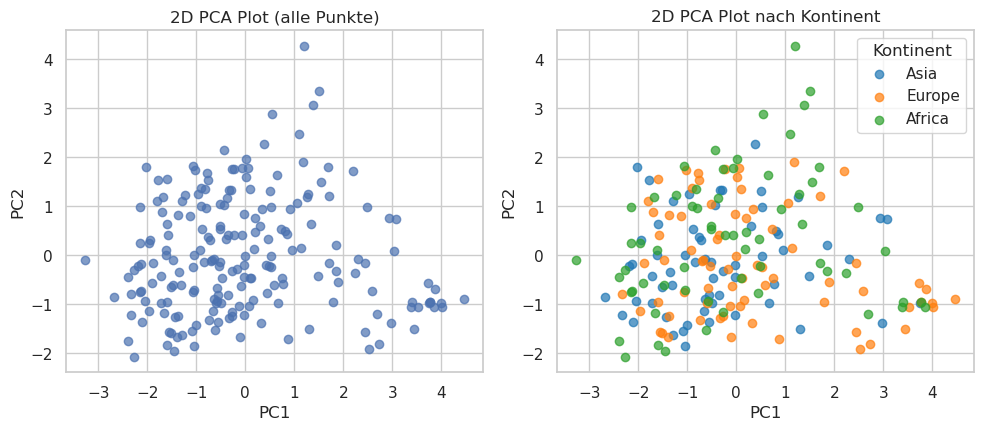

In [97]:
# --- PCA wie gehabt ---
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns
X_scaled_numeric = df_scaled[numerical_cols]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled_numeric)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Country'] = df['Country']
df_pca['Continent'] = df['Continent']

# --- Zwei Subplots erstellen ---
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# 1. Scatterplot: neutral (alle Punkte gleiche Farbe)
axes[0].scatter(df_pca['PC1'], df_pca['PC2'], alpha=0.7)
axes[0].set_title('2D PCA Plot (alle Punkte)')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].set_aspect('equal', adjustable='box')

# 2. Scatterplot: nach Continent einfärben
# Automatische Farbauswahl:
import seaborn as sns
unique_vals = df_pca['Continent'].unique()
palette = sns.color_palette("tab10", n_colors=len(unique_vals))
color_dict = dict(zip(unique_vals, palette))

for continent in unique_vals:
    idx = df_pca['Continent'] == continent
    axes[1].scatter(df_pca.loc[idx, 'PC1'], df_pca.loc[idx, 'PC2'],
                    label=continent, alpha=0.7, color=color_dict[continent])

axes[1].set_title('2D PCA Plot nach Kontinent')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].set_aspect('equal', adjustable='box')
axes[1].legend(title='Kontinent')

plt.tight_layout()
plt.show()


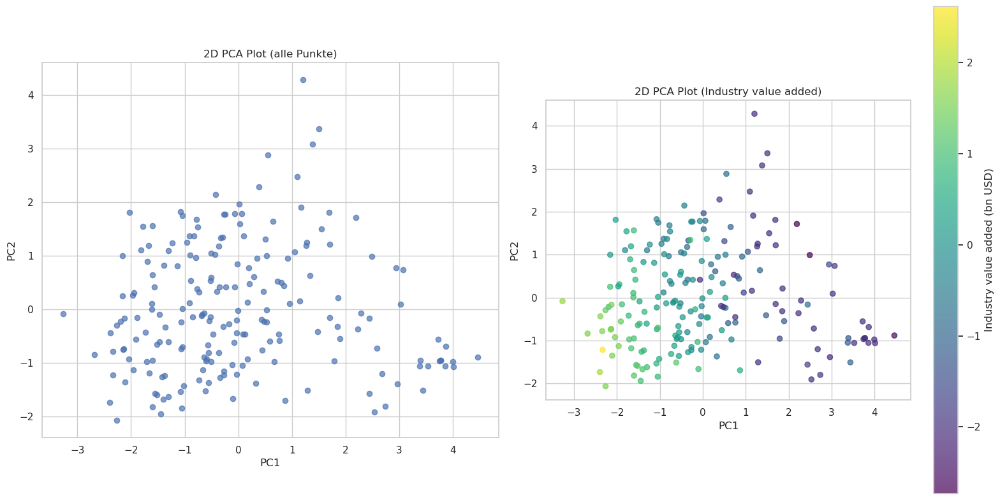

In [98]:
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns
X_scaled_numeric = df_scaled[numerical_cols]

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled_numeric)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

# --- Zwei Subplots erstellen ---
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# 1. Scatterplot: neutral (alle Punkte gleiche Farbe)
axes[0].scatter(df_pca['PC1'], df_pca['PC2'], alpha=0.7)
axes[0].set_title('2D PCA Plot (alle Punkte)')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].set_aspect('equal', adjustable='box')

# 2. Scatterplot: nach numerischer Spalte einfärben
sc = axes[1].scatter(
    df_pca['PC1'],
    df_pca['PC2'],
    c=df_scaled['Industry value added billion USD'],
    cmap='viridis',  # Oder 'plasma', 'coolwarm', etc.
    alpha=0.7
)
axes[1].set_title('2D PCA Plot (Industry value added)')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].set_aspect('equal', adjustable='box')

# Farbleiste (colorbar) hinzufügen
cbar = plt.colorbar(sc, ax=axes[1])
cbar.set_label('Industry value added (bn USD)')

plt.tight_layout()
plt.show()


A principal component (like PC1 or PC2) is a linear combination of your original features, weighted by their respective loadings.
Formally:

A principal component is calculated as:

PCk​=a1​⋅x1​+a2​⋅x2​+...+an​⋅xn​

    x1,...,xn: your original features

    a1,...,an: the loadings of each feature on the given component (these are the values in your DataFrame)

In [99]:
# Die Ladungen der ursprünglichen Features in den Hauptkomponenten
feature_importance = pd.DataFrame(pca.components_, columns=numerical_cols, index=['PC1', 'PC2'])

# Ausgabe der Feature-Wichtigkeiten
print("Wichtigkeit der ursprünglichen Features in den Hauptkomponenten:")
feature_importance


Wichtigkeit der ursprünglichen Features in den Hauptkomponenten:


,Industry value added billion USD,Population size in millions,Capital investment as percent of GDP,Economic growth: the rate of change of real GDP,Economic decline index 0 (low) - 10 (high),Economic freedom overall index (0-100),Population growth percent
PC1,-0.611044,-0.532396,-0.408176,0.050128,-0.188095,-0.347727,-0.133285
PC2,-0.305973,0.213100,-0.081564,0.035868,0.653439,-0.269090,0.594674


### UMAP

#### 2D

In [100]:

# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

# 2D UMAP
umap_model = umap.UMAP(n_components=2)
X_umap = umap_model.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])

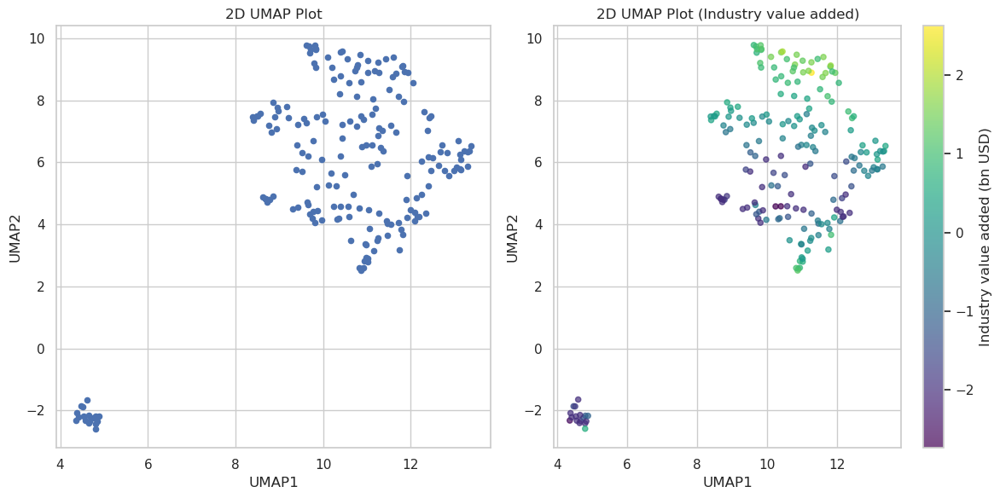

In [101]:
# --- Zwei Subplots erstellen ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# 1. Scatterplot: neutral (alle Punkte gleiche Farbe)
axes[0].scatter(df_umap['UMAP1'], df_umap['UMAP2'], s=20)
axes[0].set_title('2D UMAP Plot')
axes[0].set_xlabel('UMAP1')
axes[0].set_ylabel('UMAP2')


# 2. Scatterplot: nach numerischer Spalte einfärben
sc = axes[1].scatter(
    df_umap['UMAP1'], df_umap['UMAP2'], s=20,
    c=df_scaled['Industry value added billion USD'],
    cmap='viridis',  # Oder 'plasma', 'coolwarm', etc.
    alpha=0.7
)
axes[1].set_title('2D UMAP Plot (Industry value added)')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')


# Farbleiste (colorbar) hinzufügen
cbar = plt.colorbar(sc, ax=axes[1])
cbar.set_label('Industry value added (bn USD)')

plt.tight_layout()
plt.show()



#### UMAP Hyperparameter

The most important parameter is **n_neighbors** - the number of approximate nearest neighbors used to construct the initial high-dimensional graph. 
It effectively controls how UMAP balances local versus global structure - low values will push UMAP to focus more on local structure by constraining the number of neighboring points considered when analyzing the data in high dimensions, while high values will push UMAP towards representing the big-picture structure while losing fine detail.

The second parameter we’ll investigate is **min_dist**, or the **minimum distance** between points in low-dimensional space. This parameter controls how tightly UMAP clumps points together, with low values leading to more tightly packed embeddings. Larger values of min_dist will make UMAP pack points together more loosely, focusing instead on the preservation of the broad topological structure.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-t

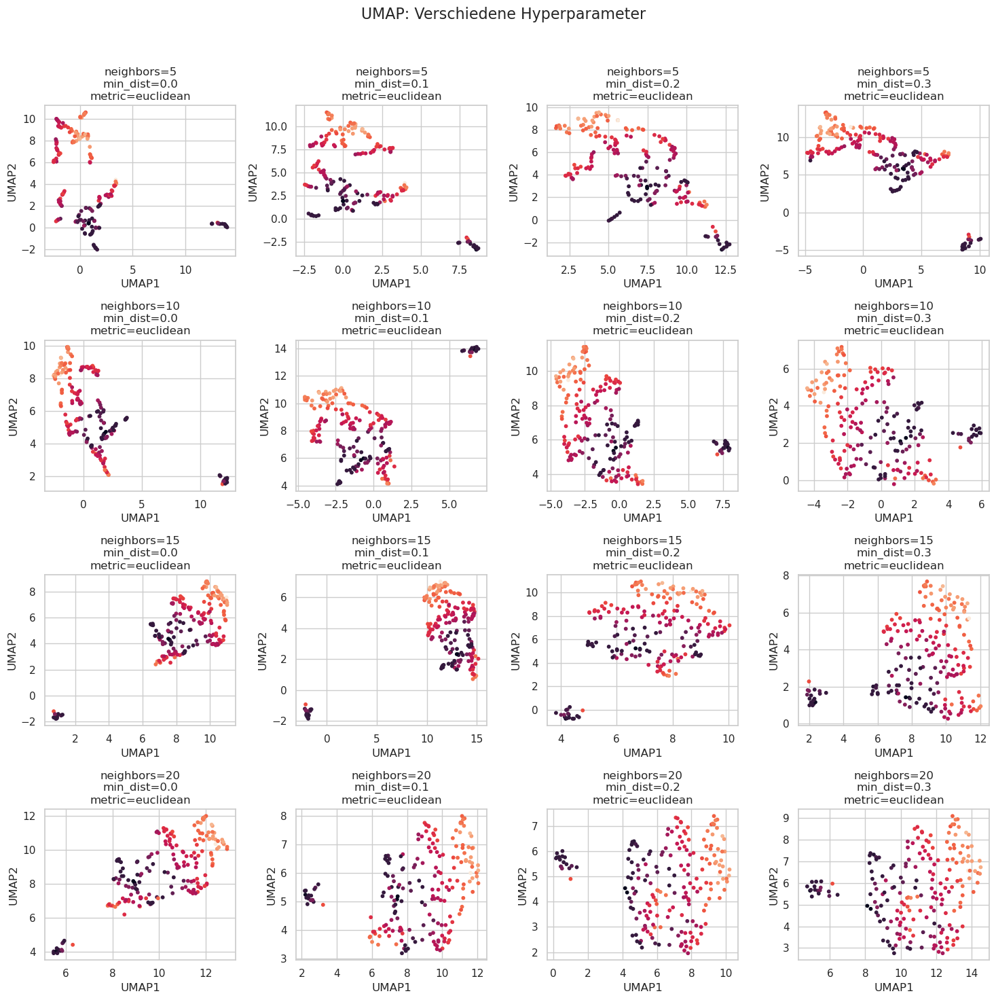

In [102]:

# Beispielwerte für Hyperparameter
n_neighbors_list = [5, 10, 15, 20]
min_dist_list = [0.0, 0.1, 0.2, 0.3]
metric_list = ['euclidean']  # Könnt ihr auch auf ['euclidean'] beschränken

# Kombinationen erzeugen
param_combinations = list(itertools.product(n_neighbors_list, min_dist_list, metric_list))

# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns
X_scaled_numeric = df_scaled[numerical_cols]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(15, 15))
fig.suptitle("UMAP: Verschiedene Hyperparameter", fontsize=16)

for idx, (n_neighbors, min_dist, metric) in enumerate(param_combinations):
    row = n_neighbors_list.index(n_neighbors)
    col = min_dist_list.index(min_dist)
    ax = axes[row, col]

    umap_model = umap.UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
        random_state=42
    )
    X_umap = umap_model.fit_transform(X_scaled_numeric)
    ax.scatter(X_umap[:, 0], X_umap[:, 1], s=10,c=df_scaled['Industry value added billion USD'] )
    ax.set_title(f"neighbors={n_neighbors}\nmin_dist={min_dist}\nmetric={metric}")
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    #ax.set_aspect('equal', adjustable='box')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



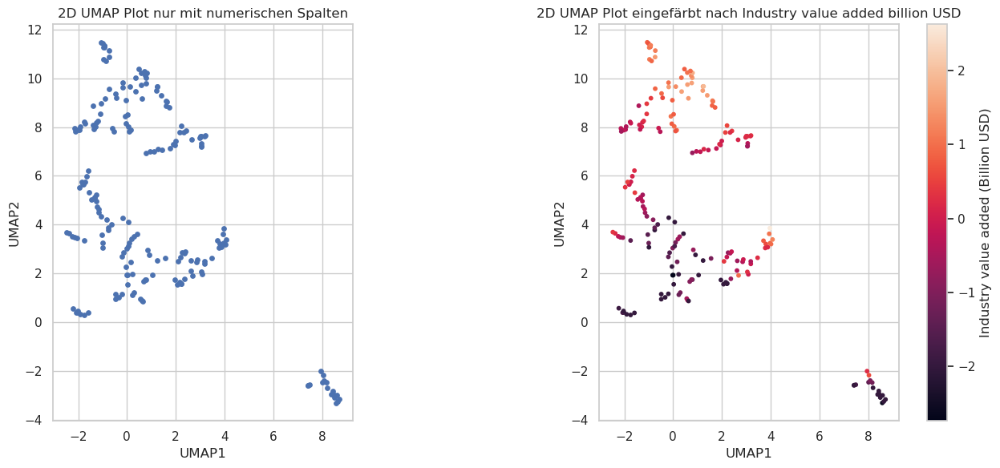

In [103]:
# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

# 2D UMAP
umap_model = umap.UMAP(n_components=2,
                        n_neighbors=5,
                        min_dist=0.1,
                        metric=metric,
                        random_state=42)
X_umap = umap_model.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])


# Subplot erstellen
fig, axs = plt.subplots(1, 2, figsize=(14, 6))  # Zwei Plots nebeneinander

# Plot 1: UMAP ohne Färbung
axs[0].scatter(df_umap['UMAP1'], df_umap['UMAP2'], s=15)
axs[0].set_title('2D UMAP Plot nur mit numerischen Spalten')
axs[0].set_xlabel('UMAP1')
axs[0].set_ylabel('UMAP2')
axs[0].set_aspect('equal', adjustable='box')

# Plot 2: UMAP eingefärbt nach 'Industry value added billion USD'
scatter = axs[1].scatter(df_umap['UMAP1'], df_umap['UMAP2'],c=df_scaled['Industry value added billion USD'], s=10)
axs[1].set_title('2D UMAP Plot eingefärbt nach Industry value added billion USD')
axs[1].set_xlabel('UMAP1')
axs[1].set_ylabel('UMAP2')
axs[1].set_aspect('equal', adjustable='box')

# Colorbar hinzufügen
cbar = fig.colorbar(scatter, ax=axs[1])
cbar.set_label('Industry value added (Billion USD)')

# Zeige den Plot an
plt.tight_layout()
plt.show()


#### 3D

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



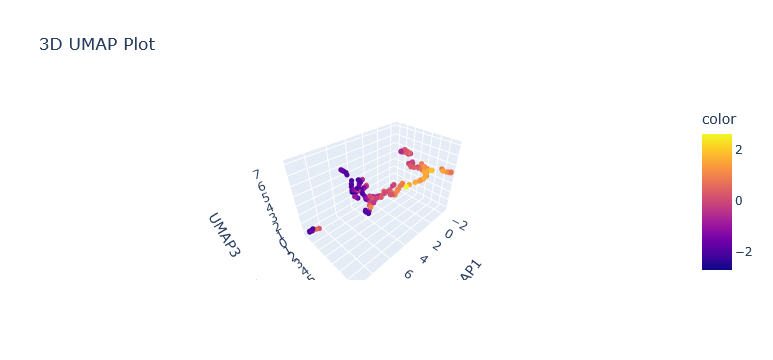

In [104]:

# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

# 3D UMAP
umap_model = umap.UMAP(n_components=3,
                        n_neighbors=5,
                        min_dist=0.1,
                        metric=metric,
                        random_state=42)

X_umap = umap_model.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2', 'UMAP3'])


# Plotly 3D Scatter-Plot erstellen, mit Färbung nach 'Industry value added billion USD'
fig = px.scatter_3d(df_umap, x='UMAP1', y='UMAP2', z='UMAP3', color=df_scaled['Industry value added billion USD'], title="3D UMAP Plot")

# Punktgröße reduzieren
fig.update_traces(marker=dict(size=3))  # Größe der Punkte anpassen

# Interaktive Ansicht (rotierbar)
fig.show()


### t-SNE

#### Hyperparameter

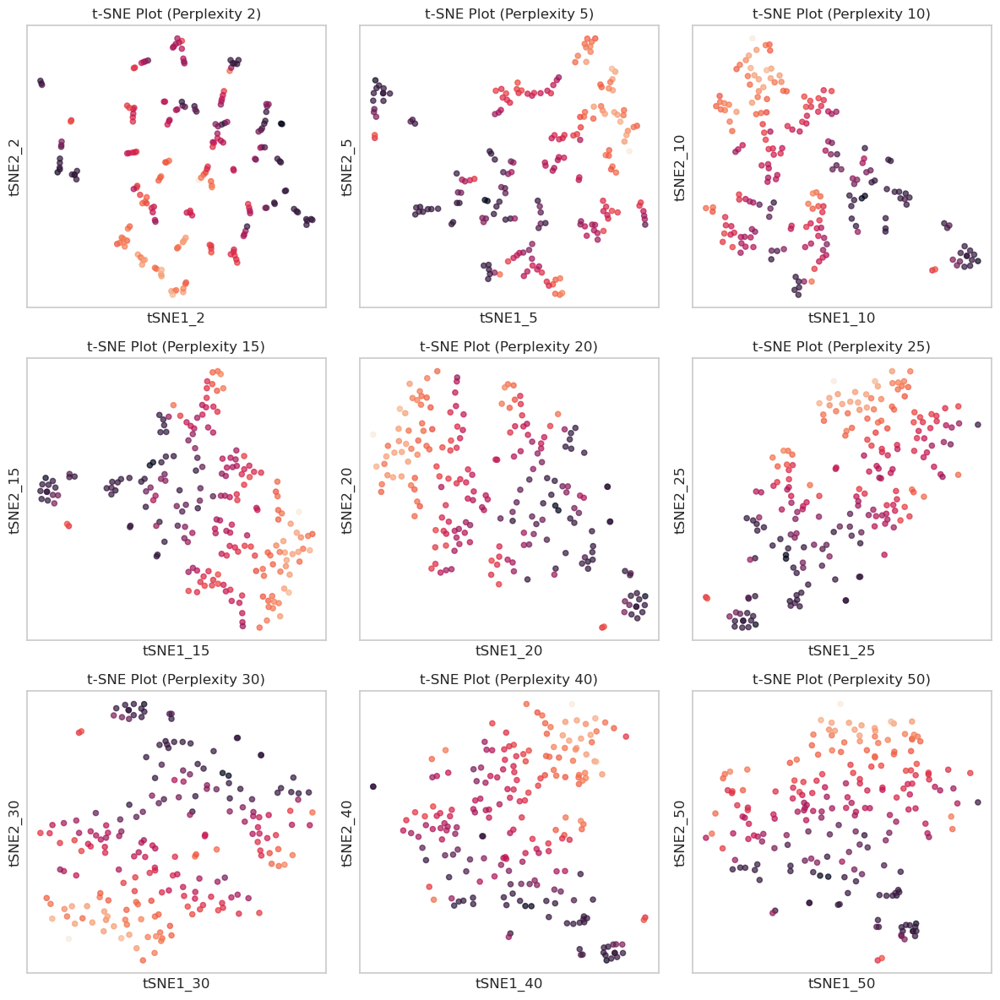

In [105]:
perplexities = [2, 5, 10, 15, 20, 25, 30, 40, 50]

plt.figure(figsize=(12, 12))  # Größer für 9 Plots

for i, perplexity in enumerate(perplexities):
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    X_tsne = tsne.fit_transform(X_scaled_numeric)
    
    df_tsne = pd.DataFrame(X_tsne, columns=[f'tSNE1_{perplexity}', f'tSNE2_{perplexity}'])
    

    plt.subplot(3, 3, i + 1)  # 3x3 Matrix
    sc = plt.scatter(
        df_tsne[f'tSNE1_{perplexity}'], 
        df_tsne[f'tSNE2_{perplexity}'], 
        c=df_scaled['Industry value added billion USD'],
        alpha=0.7,
        s=20
    )
    plt.title(f't-SNE Plot (Perplexity {perplexity})')
    plt.xlabel(f'tSNE1_{perplexity}')
    plt.ylabel(f'tSNE2_{perplexity}')
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()


plt.show()


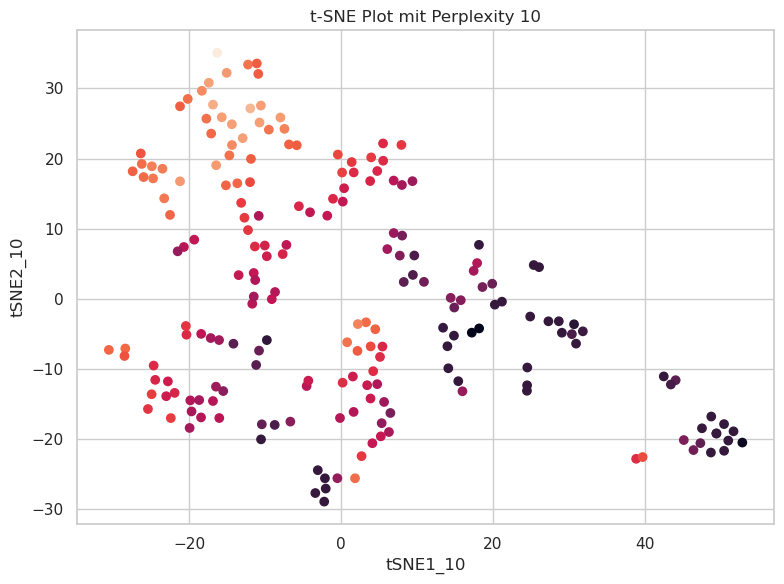

In [106]:
# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

perplexity = 10


plt.figure(figsize=(8, 6))  # Plotgröße

tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
X_tsne = tsne.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_tsne = pd.DataFrame(X_tsne, columns=[f'tSNE1_{perplexity}', f'tSNE2_{perplexity}'])
df_tsne['Country'] = df['Country']
df_tsne['Continent'] = df['Continent']

# Scatter-Plot für Perplexity 5
plt.scatter(df_tsne[f'tSNE1_{perplexity}'], df_tsne[f'tSNE2_{perplexity}'], c=df_scaled['Industry value added billion USD'])
plt.title(f't-SNE Plot mit Perplexity {perplexity}')
plt.xlabel(f'tSNE1_{perplexity}')
plt.ylabel(f'tSNE2_{perplexity}')

plt.tight_layout()
plt.show()


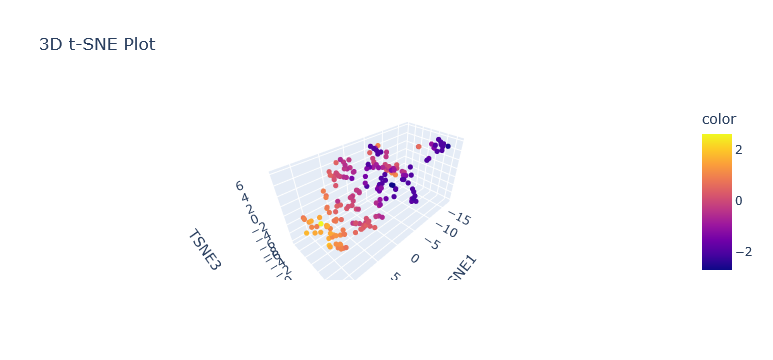

In [107]:
# Nur numerische Spaltennamen aus df ermitteln
numerical_cols = df_scaled.select_dtypes(include=['float64', 'int64']).columns

# Diese Spalten aus df_scaled extrahieren
X_scaled_numeric = df_scaled[numerical_cols]

# t-SNE mit Perplexity 5
tsne_model = TSNE(n_components=3, perplexity=10)
X_tsne = tsne_model.fit_transform(X_scaled_numeric)

# Ergebnis-DataFrame
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['Country'] = df['Country']
df_tsne['Continent'] = df['Continent']

# Plotly 3D Scatter-Plot erstellen
fig = px.scatter_3d(df_tsne, x='TSNE1', y='TSNE2', z='TSNE3', color=df_scaled['Industry value added billion USD'], title="3D t-SNE Plot")

# Punktgröße reduzieren
fig.update_traces(marker=dict(size=3))  # Größe der Punkte anpassen

# Interaktive Ansicht (rotierbar)
fig.show()


## "Real Life" Examples

### Iris Data Set

In [64]:
# 1. Datensatz laden (hier: Iris)
data = datasets.load_iris()
X = data.data
y = data.target
target_names = data.target_names

In [65]:
X[:10]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1]])

In [66]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [67]:
target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [108]:
# 2. Methoden anwenden
X_pca = PCA(n_components=2).fit_transform(X)
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X)
X_umap = umap.UMAP(n_components=2, random_state=42).fit_transform(X)

# 3. Visualisierung
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
titles = ['PCA', 't-SNE', 'UMAP']
datasets_2d = [X_pca, X_tsne, X_umap]

for i, ax in enumerate(axs):
    for target in np.unique(y):
        ax.scatter(
            datasets_2d[i][y == target, 0],
            datasets_2d[i][y == target, 1],
            label=target_names[target],
            alpha=0.7,
            s=40
        )
    ax.set_title(titles[i])
    ax.legend()
plt.tight_layout()
plt.show()


/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.


KeyboardInterrupt



Error in callback <function flush_figures at 0x14e375c8bb50> (for post_execute):



KeyboardInterrupt



/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



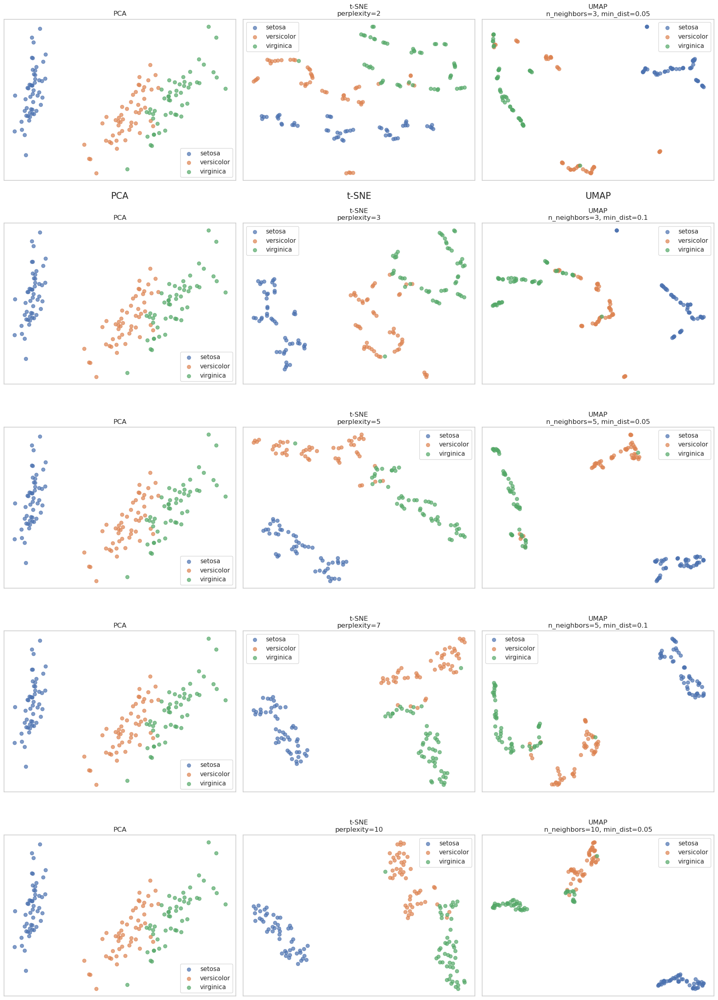

In [69]:
# Parameterkombinationen
tsne_params = [
    {"perplexity": 2},
    {"perplexity": 3},
    {"perplexity": 5},
    {"perplexity": 7},
    {"perplexity": 10},
]
umap_params = [
    {"n_neighbors": 3, "min_dist": 0.05},
    {"n_neighbors": 3, "min_dist": 0.1},
    {"n_neighbors": 5, "min_dist": 0.05},
    {"n_neighbors": 5, "min_dist": 0.1},
    {"n_neighbors": 10, "min_dist": 0.05},
]

# Ergebnisse speichern
datasets_2d = {
    "PCA": [],
    "t-SNE": [],
    "UMAP": []
}

# PCA
X_pca = PCA(n_components=2).fit_transform(X)
datasets_2d["PCA"] = [X_pca] * 5

# t-SNE
for param in tsne_params:
    X_tsne = TSNE(
        n_components=2,
        random_state=42,
        perplexity=param["perplexity"]        
    ).fit_transform(X)
    datasets_2d["t-SNE"].append(X_tsne)

# UMAP
for param in umap_params:
    X_umap = umap.UMAP(
        n_components=2,
        random_state=42,
        n_neighbors=param["n_neighbors"],
        min_dist=param["min_dist"]
    ).fit_transform(X)
    datasets_2d["UMAP"].append(X_umap)

# 5 Zeilen (Parameter), 3 Spalten (Methoden)
fig, axs = plt.subplots(5, 3, figsize=(18, 25))

methods = ["PCA", "t-SNE", "UMAP"]
paramlists = [
    [{}]*5,
    tsne_params,
    umap_params
]

for row in range(5):
    for col, (method, paramlist) in enumerate(zip(methods, paramlists)):
        data = datasets_2d[method][row]
        ax = axs[row, col]
        for target in np.unique(y):
            ax.scatter(
                data[y == target, 0],
                data[y == target, 1],
                label=target_names[target],
                alpha=0.7,
                s=40
            )
        # Titel setzen
        if method == "PCA":
            title = f"{method}"
        elif method == "t-SNE":
            param = paramlist[row]
            title = f"{method}\nperplexity={param['perplexity']}"
        else:
            param = paramlist[row]
            title = f"{method}\nn_neighbors={param['n_neighbors']}, min_dist={param['min_dist']}"
        ax.set_title(title)
        ax.legend()
        ax.set_xticks([])
        ax.set_yticks([])

# Achsen-Labels für die Methoden (Spalten)
for col, method in enumerate(methods):
    axs[0, col].set_xlabel(method, fontsize=16, labelpad=20)

plt.tight_layout()
plt.show()


### scikit learn digits dataset

In [70]:
# 1. Digits-Datensatz laden (https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_digits.html)
digits = datasets.load_digits()
X = digits.data
y = digits.target

In [71]:
X[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

In [72]:
len(X[0])

64

In [73]:
y[:20]

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

(1797, 64)


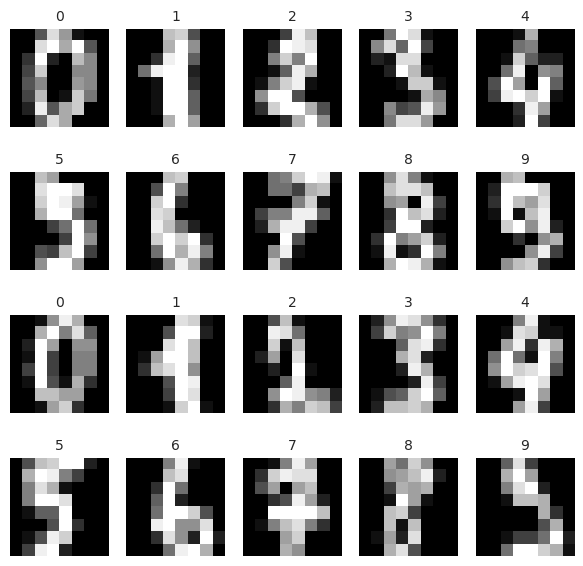

In [74]:
print(digits.data.shape)  # (1797, 64) z.B.

plt.figure(figsize=(6, 6))
for i in range(20):
    plt.subplot(4, 5, i + 1)
    plt.imshow(digits.images[i], cmap='gray')
    plt.axis('off')
    plt.title(str(digits.target[i]), fontsize=10)
plt.tight_layout()
plt.show()

/home/lbader/.conda/envs/py310-dm-tf-cloned/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



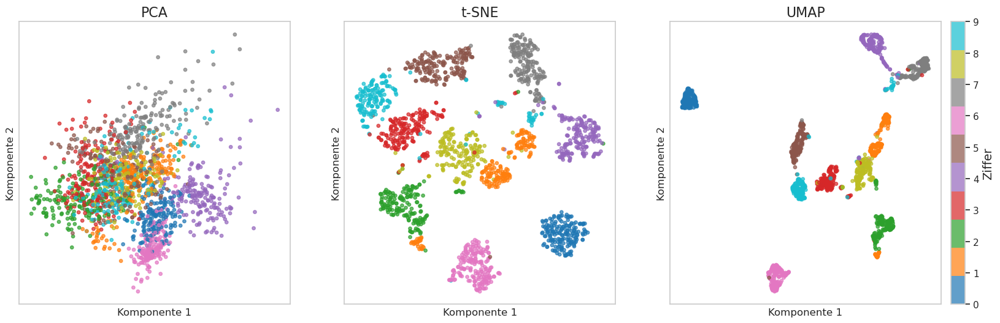

In [75]:
from sklearn.preprocessing import StandardScaler

# Optional: Daten skalieren (empfohlen für t-SNE & UMAP)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Methoden anwenden
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_scaled)
X_tsne = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(X_scaled)
X_umap = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1).fit_transform(X_scaled)

# 3. Visualisierung
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
titles = ['PCA', 't-SNE', 'UMAP']
datasets_2d = [X_pca, X_tsne, X_umap]

for i, ax in enumerate(axs):
    scatter = ax.scatter(
        datasets_2d[i][:, 0],
        datasets_2d[i][:, 1],
        c=y,
        cmap='tab10',
        alpha=0.7,
        s=15
    )
    ax.set_title(titles[i], fontsize=16)
    ax.set_xlabel("Komponente 1")
    ax.set_ylabel("Komponente 2")
    ax.set_xticks([])
    ax.set_yticks([])

# Farblegende
legend = fig.colorbar(scatter, ax=axs, orientation="vertical", fraction=0.02, pad=0.01)
legend.set_label('Ziffer', fontsize=14)

#plt.tight_layout()
plt.show()
